# Neural Mechanics II

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib
import matplotlib.patches as mpatches
import scipy.stats as st
import matplotlib.animation as animation
plt.rcParams.update({'font.size': 22})

# Ornstein-Uhlenbeck Process with Anisotropic Noise

[[ 2.5 -1.5]
 [-1.5  2.5]]
[[ 2.5 -1.5]
 [-1.5  2.5]]
[[0. 0.]
 [0. 0.]]
[[1.00000000e+00 0.00000000e+00]
 [1.11022302e-16 1.00000000e+00]]


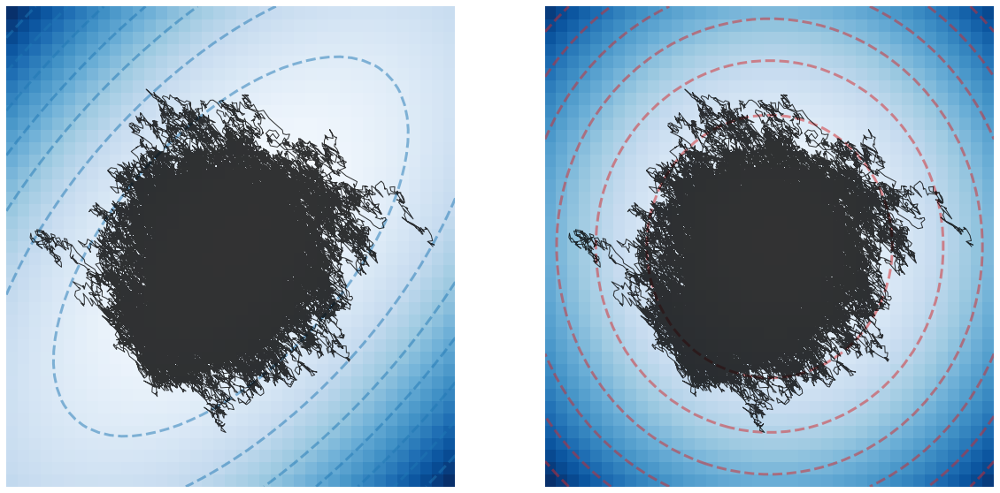

In [50]:
import matplotlib.animation as animation

Sigma = np.array([4,1])
V = np.array([[-1,1],[1,1]])
V_inv = np.linalg.inv(V)
A = V_inv.dot(np.diag(Sigma)).dot(V)

D = A#np.array([[3,1],[1,1]])

def get_Q(V, V_inv, Sigma, D):
    D = V.dot(D).dot(V_inv)
    Q = np.zeros_like(D)
    for i in range(2):
        for j in range(2):
            Q[i,j] = D[i,j] * (Sigma[i] - Sigma[j]) / (Sigma[i] + Sigma[j])
    Q = V_inv.dot(Q).dot(V)
    return Q

def get_U(A, D, Q):
    B = np.linalg.inv(D + Q)
    U = B.dot(A)
    return U

Q = get_Q(V, V_inv, Sigma, D)
U = get_U(A, D, Q)


print(A)
print(D)
print(Q)
print(U)


def SDE(x10, x20, num_steps, eta, A, D):
    x1 = [x10]
    x2 = [x20]
    L = np.linalg.cholesky(D)
    for i in range(num_steps):
        xi = L.dot(np.random.normal(0, eta, 2))
        g1 = eta * (A[0,0] * x1[-1]  +  A[0,1] * x2[-1]) + xi[0]
        g2 = eta * (A[1,0] * x1[-1]  +  A[1,1] * x2[-1]) + xi[1]
        x1.append(x1[-1] - g1)
        x2.append(x2[-1] - g2)
    return x1, x2

n = 0.1
# eta=0.1  
# num_steps = 20
# T = num_steps * eta
# time = np.linspace(0, T, 100000)
# gf_1, gf_2 = gradient_flow(w10, w20, time, Sigma, V, V_inv)
# gd_1, gd_2 = gradient_descent(w10, w20, num_steps, eta, A)
# ml_1, ml_2 = gradient_flow(w10, w20, time, Sigma * (1 + eta/2 * Sigma), V, V_inv)
# me_1, me_2 = modified_gradient_flow(w10, w20, time, eta, Sigma, V, V_inv)


fig, ax = plt.subplots(1, 2, figsize=(20,10))
# ax.plot(gf_1, gf_2, color=plt.cm.tab10(0), label='Gradient Flow', lw=5)
# ax.plot(ml_1, ml_2, color=plt.cm.tab10(3), label='Modified Loss', lw=5)
# ax.plot(me_1, me_2, color=plt.cm.tab10(4), label='Modified Flow', lw=5)
# ax.scatter(gd_1, gd_2, color='k', alpha=0.9, label='Gradient Descent', zorder=100, s=50)
# ax.scatter(w10, w20, color='w', zorder=120, s=200, edgecolors='k', linewidth=3)

ax[0].axis('off')
ax[1].axis('off')

ax[0].set_xlim([-n, n])
ax[0].set_ylim([-n, n])
ax[1].set_xlim([-n, n])
ax[1].set_ylim([-n, n])

x10 = 0.09
x20 = 0
num_steps=100000
eta = 1e-3
x1, x2 = SDE(x10, x20, num_steps, eta, A, D)

ims = []
m = 50
k = int(num_steps / m)
for i in range(m):
    SDE1 = ax[0].plot(x1[:k*(i)], x2[:k*(i)], color='k', alpha=0.8, lw=1)
    SDE2 = ax[1].plot(x1[:k*(i)], x2[:k*(i)], color='k', alpha=0.8, lw=1)
    
    ims.append(SDE1 + SDE2)


X1, X2 = np.meshgrid(np.linspace(-n, n, 40), np.linspace(-n, n, 40))
Phi = 0.5 * (A[0,0] * X1**2 + (A[0,1] + A[1,0])*X1*X2 + A[1,1] * X2**2)
Psi = 0.5 * (U[0,0] * X1**2 + (U[0,1] + U[1,0])*X1*X2 + U[1,1] * X2**2)

ax[0].contour(X1, X2, Phi, colors=[plt.cm.tab10(0)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[0].pcolormesh(X1, X2, Phi, cmap='Blues')
ax[1].contour(X1, X2, Psi, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[1].pcolormesh(X1, X2, Psi, cmap='Blues')

QU = Q.dot(U)
J1 = QU[0,0] * X1 + QU[0,1] * X2
J2 = QU[1,0] * X1 + QU[1,1] * X2
ax[1].streamplot(X1, X2, J1, J2)#, cmap='Blues')


ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat_delay=500)

ani.save("OU.gif", writer='imagemagick')

# plt.tight_layout()
# plt.savefig('modified-equation-quadtratic.pdf', format='pdf', bbox_inches='tight')

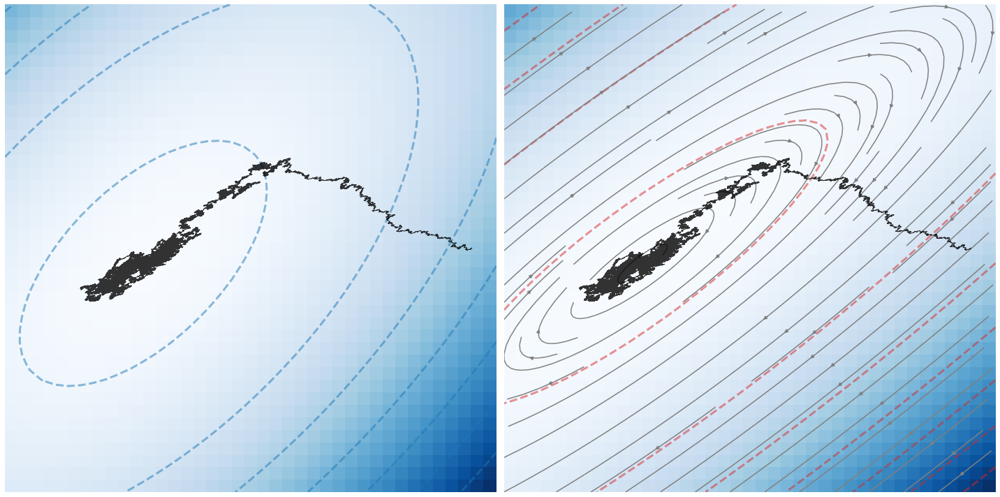

In [36]:
def get_Q(V, V_inv, Sigma, D):
    D = V.dot(D).dot(V_inv)
    Q = np.zeros_like(D)
    for i in range(2):
        for j in range(2):
            Q[i,j] = D[i,j] * (Sigma[i] - Sigma[j]) / (Sigma[i] + Sigma[j])
    Q = V_inv.dot(Q).dot(V)
    return Q

def get_U(A, D, Q):
    B = np.linalg.inv(D + Q)
    U = B.dot(A)
    return U

def SDE(x10, x20, num_steps, eta, A, b, D):
    x1 = [x10]
    x2 = [x20]
    L = np.linalg.cholesky(D)
    for i in range(num_steps):
        xi = L.dot(np.random.normal(0, eta, 2))
        g1 = eta * (A[0,0] * x1[-1]  +  A[0,1] * x2[-1] - b[0]) + xi[0]
        g2 = eta * (A[1,0] * x1[-1]  +  A[1,1] * x2[-1] - b[1]) + xi[1]
        x1.append(x1[-1] - g1)
        x2.append(x2[-1] - g2)
    return x1, x2

def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

Sigma = np.array([4,1])
V = np.array([[-1,1],[1,1]])
V_inv = np.linalg.inv(V)
A = V_inv.dot(np.diag(Sigma)).dot(V)
b = np.array([-0.1,0.05])
D = np.array([[3,1],[1,1]])
Q = get_Q(V, V_inv, Sigma, D)
U = get_U(A, D, Q)
u = U.dot(np.linalg.inv(A)).dot(b)

n = 0.1

fig, ax = plt.subplots(1, 2, figsize=(20,10))

ax[0].axis('off')
ax[1].axis('off')

ax[0].set_xlim([-n, n])
ax[0].set_ylim([-n, n])
ax[1].set_xlim([-n, n])
ax[1].set_ylim([-n, n])

x10 = 0.09
x20 = 0
num_steps=100000
eta = 1e-4
x1, x2 = SDE(x10, x20, num_steps, eta, A, b, D)

ax[0].plot(x1, x2, color='k', alpha=0.8, lw=1)
ax[1].plot(x1, x2, color='k', alpha=0.8, lw=1)


X1, X2 = np.meshgrid(np.linspace(-n, n, 40), np.linspace(-n, n, 40))
Phi = 0.5 * (A[0,0] * X1**2 + (A[0,1] + A[1,0])*X1*X2 + A[1,1] * X2**2) - b[0] * X1 - b[1] * X2
Psi = 0.5 * (U[0,0] * X1**2 + (U[0,1] + U[1,0])*X1*X2 + U[1,1] * X2**2) - u[0] * X1 - u[1] * X2

ax[0].contour(X1, X2, Phi, colors=[plt.cm.tab10(0)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[0].pcolormesh(X1, X2, Phi, cmap='Blues')
ax[1].contour(X1, X2, Psi, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[1].pcolormesh(X1, X2, Psi, cmap='Blues')

QU = Q.dot(U)
Du_b = -Q.dot(u)
J1 = QU[0,0] * X1 + QU[0,1] * X2 + Du_b[0]
J2 = QU[1,0] * X1 + QU[1,1] * X2 + Du_b[1]
ax[1].streamplot(X1, X2, J1, J2, color='grey')

plt.tight_layout()
plt.savefig('OU.png', format='png', bbox_inches='tight')

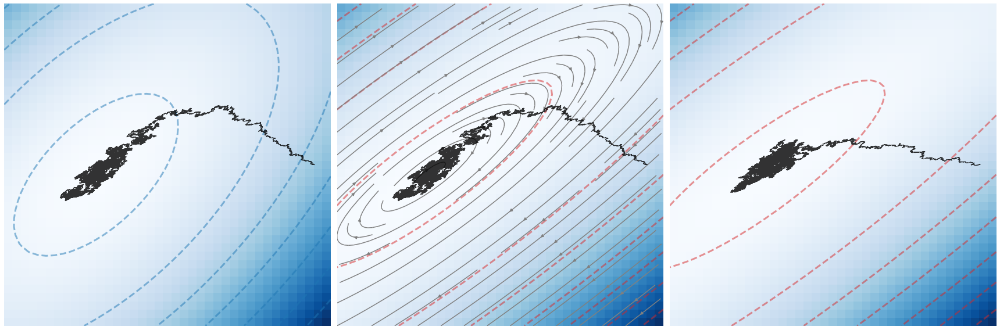

In [39]:
def get_Q(V, V_inv, Sigma, D):
    D = V.dot(D).dot(V_inv)
    Q = np.zeros_like(D)
    for i in range(2):
        for j in range(2):
            Q[i,j] = D[i,j] * (Sigma[i] - Sigma[j]) / (Sigma[i] + Sigma[j])
    Q = V_inv.dot(Q).dot(V)
    return Q

def get_U(A, D, Q):
    B = np.linalg.inv(D + Q)
    U = B.dot(A)
    return U

def SDE(x10, x20, num_steps, eta, A, b, D):
    x1 = [x10]
    x2 = [x20]
    L = np.linalg.cholesky(D)
    for i in range(num_steps):
        xi = L.dot(np.random.normal(0, eta, 2))
        g1 = eta * (A[0,0] * x1[-1]  +  A[0,1] * x2[-1] - b[0]) + xi[0]
        g2 = eta * (A[1,0] * x1[-1]  +  A[1,1] * x2[-1] - b[1]) + xi[1]
        x1.append(x1[-1] - g1)
        x2.append(x2[-1] - g2)
    return x1, x2

def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

Sigma = np.array([4,1])
V = np.array([[-1,1],[1,1]])
V_inv = np.linalg.inv(V)
A = V_inv.dot(np.diag(Sigma)).dot(V)
b = np.array([-0.1,0.05])
D = np.array([[3,1],[1,1]])
Q = get_Q(V, V_inv, Sigma, D)
U = get_U(A, D, Q)
u = U.dot(np.linalg.inv(A)).dot(b)

n = 0.1

fig, ax = plt.subplots(1, 3, figsize=(24,8))

ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

ax[0].set_xlim([-n, n])
ax[0].set_ylim([-n, n])
ax[1].set_xlim([-n, n])
ax[1].set_ylim([-n, n])
ax[2].set_xlim([-n, n])
ax[2].set_ylim([-n, n])

x10 = 0.09
x20 = 0
num_steps=100000
eta = 1e-4
x1, x2 = SDE(x10, x20, num_steps, eta, A, b, D)
y1, y2 = SDE(x10, x20, num_steps, eta, D.dot(U), D.dot(u), D)

ax[0].plot(x1, x2, color='k', alpha=0.8, lw=1)
ax[1].plot(x1, x2, color='k', alpha=0.8, lw=1)
ax[2].plot(y1, y2, color='k', alpha=0.8, lw=1)

X1, X2 = np.meshgrid(np.linspace(-n, n, 40), np.linspace(-n, n, 40))
Phi = 0.5 * (A[0,0] * X1**2 + (A[0,1] + A[1,0])*X1*X2 + A[1,1] * X2**2) - b[0] * X1 - b[1] * X2
Psi = 0.5 * (U[0,0] * X1**2 + (U[0,1] + U[1,0])*X1*X2 + U[1,1] * X2**2) - u[0] * X1 - u[1] * X2

ax[0].contour(X1, X2, Phi, colors=[plt.cm.tab10(0)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[0].pcolormesh(X1, X2, Phi, cmap='Blues')
ax[1].contour(X1, X2, Psi, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[1].pcolormesh(X1, X2, Psi, cmap='Blues')
ax[2].contour(X1, X2, Psi, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[2].pcolormesh(X1, X2, Psi, cmap='Blues')

QU = Q.dot(U)
Du_b = -Q.dot(u)
J1 = QU[0,0] * X1 + QU[0,1] * X2 + Du_b[0]
J2 = QU[1,0] * X1 + QU[1,1] * X2 + Du_b[1]
ax[1].streamplot(X1, X2, J1, J2, color='grey')

plt.tight_layout()
plt.savefig('OU.png', format='png', bbox_inches='tight')

Given a trajectory sampled from a stationary solution can you tell whether the stationary solution is in detailed balance or broken detailed balance?  The main idea above is that the norm of the incremeental change would depend on wheteher $j(x) = 0$ (detailed balance) or $j(x) \neq 0$ (broken detailed balance).  But is there a way to tell given a single trajectory?

# Simple Linear Regression with SGD

### Utility Functions

In [2]:
# Builds a random dataset such that when used in linear regression
# their is a certain SVD structure to the Hessian of the MSE loss
# n: number of data points
# angle: angle of major axis in degrees
# condition: condition number ratio of major and minor axis
# w: true weight
# b: true bias
# sigma: variance of error
def dataset(n, angle, condition, w, b, sigma=1.0):
    # Build Eigenvector matrix
    theta = np.radians(angle)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c, -s), (s, c)))

    # Build Eigenvector matrix
    Sigma = np.diag(np.array([np.sqrt(condition),1]))

    # Build data matrix 
    Q, _ = np.linalg.qr(np.random.randn(n, 2))
    X = Q.dot(Sigma).dot(R)

    # Project data matrix so second column is all one
    v = X[:,1] - np.linalg.norm(X[:,1]) / np.sqrt(n) * np.ones(n)
    H = np.eye(n) - 2 * np.outer(v, v) / np.linalg.norm(v)**2
    X = H.dot(X) * np.sqrt(n) / np.linalg.norm(X[:,1])
    X = X[:,0]
    
    # Sample Output from data matrix
    eps = np.random.normal(0,sigma,n)
    Y = w*X + b + eps

    return X, Y

# Generator that samples batches randomly with/without replacement
# X: input dataset
# Y: output dataset
# s: batch size
# replace: whether to sample with/without replacement
def random(X, Y, s, replace=True):
    n = X.shape[0]
    while True:
        batch_idx = np.random.choice(n, s, replace=replace)
        x = X[batch_idx]
        y = Y[batch_idx]
        yield x,y 

# Generator that samples batch iteratively through the entire dataset
# X: input dataset
# Y: output dataset
# s: batch size
# shuffle: whether to shuffle the dataset between epochs
def iterative(X, Y, s, shuffle=True):
    n = X.shape[0]
    while True:
        idx = np.arange(n)
        if shuffle:
            np.random.shuffle(idx)
        for i in range(n // s):
            batch_idx = idx[s*i:s*(i+1)]
            x = X[batch_idx]
            y = Y[batch_idx]
            yield x, y

# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def gradient(w, b, x, y, lamb):
    dw = np.mean(x * (w * x + b - y)) + lamb * w
    db = np.mean(w * x + b - y) + lamb * b
    return dw, db

# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def momentum(w10, w20, X, Y, eta, beta, s, lamb, steps, sampler):
    w1 = [w10]
    w2 = [w20]
    V1 = [0]
    V2 = [0]
    v1 = 0
    v2 = 0
    dataloader = sampler(X, Y, s)
    for i in range(steps):
        x, y = next(dataloader)
        g1, g2 = gradient(w1[-1], w2[-1], x, y, lamb)
        v1 = beta * v1 + g1
        v2 = beta * v2 + g2
        w1.append(w1[-1] - eta * v1)
        w2.append(w2[-1] - eta * v2)
        V1.append(-v1)
        V2.append(-v2)
    return w1, w2, V1, V2

### Setup

In [3]:
# Data Setup
n = 10000
angle = 45
condition = 4
w = 0.5
b = 0.5
X, Y = dataset(n, angle, condition, w, b)

# Optimization Hyperparameters
x10 = -1
x20 = -1
eta = 1e-1
beta = 0.9
s = 10
lamb = 0.0
steps = 10000

# Run SGD
x1, x2, v1, v2 = momentum(x10, x20, X, Y, eta, beta, s, lamb, steps, iterative)

## Condition Number Experiment

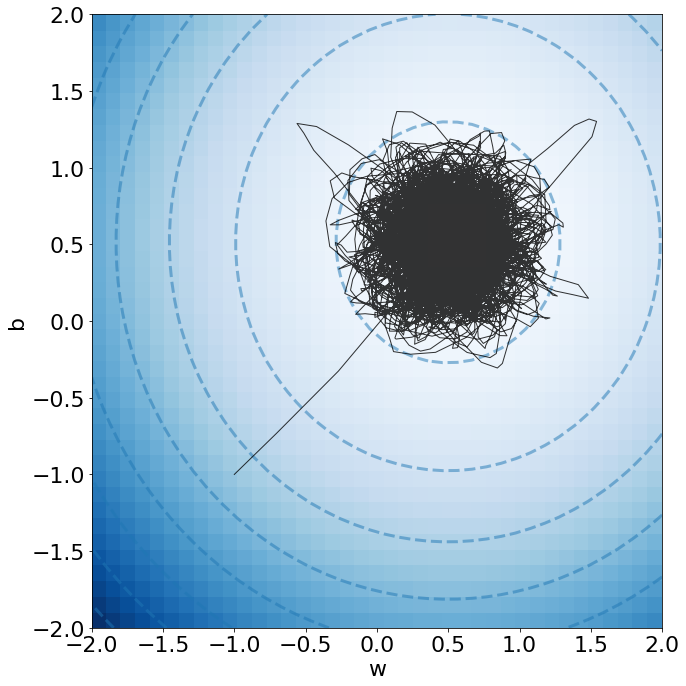

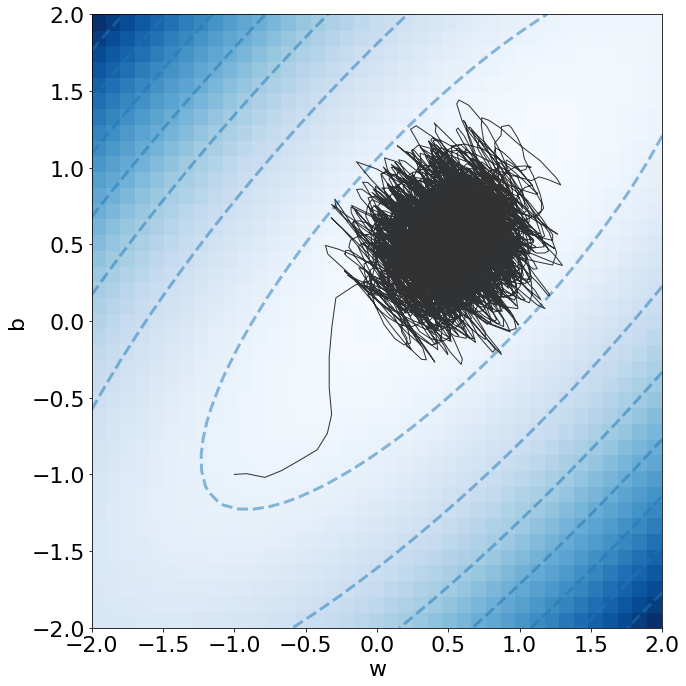

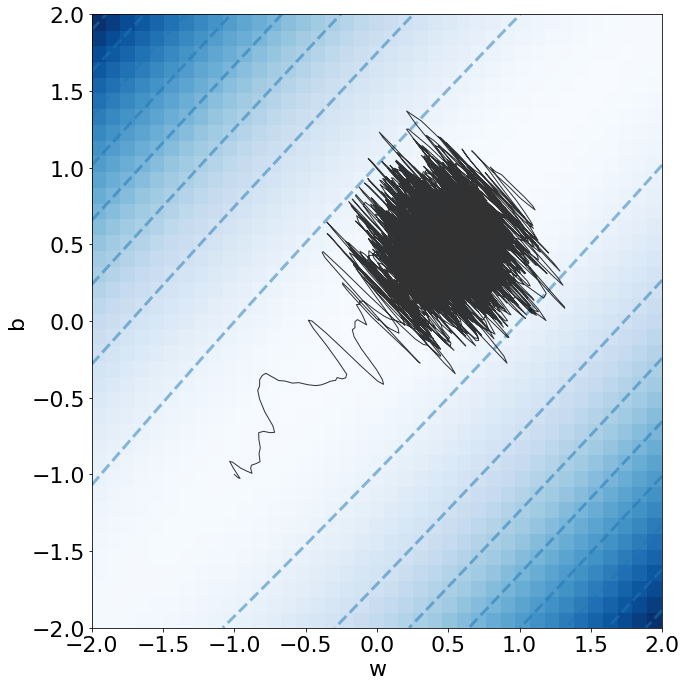

In [21]:
def loss(W1, W2, X, Y):
    Phi = np.zeros_like(W1)
    for i in range(n):
        Phi += 0.5 * (Y[i] - (W1*X[i] + W2))**2
    return Phi/n
    
W1, W2 = np.meshgrid(np.linspace(-2, 2, 40), np.linspace(-2, 2, 40))

for i, c in enumerate([1,10,100]):
    fig, ax = plt.subplots(1, 1, figsize=(10,10))
    X, Y = dataset(n, angle, c, w, b)
    x1, x2, v1, v2 = momentum(x10, x20, X, Y, eta, beta, s, lamb, steps, iterative)
    ax.plot(x1, x2, color='k', alpha=0.8, lw=1)
    Phi = loss(W1, W2, X, Y)
    ax.contour(W1, W2, Phi, colors=[plt.cm.tab10(0)], alpha=0.5, linestyles='dashed', linewidths=3)
    ax.pcolormesh(W1, W2, Phi, cmap='Blues')
    ax.set_xlabel('w')
    ax.set_ylabel('b')

    plt.tight_layout()
    plt.savefig('condition-{}.png'.format(c), format='png', bbox_inches='tight', transparent=True)

## Learning Rate & Batch Size Experiment

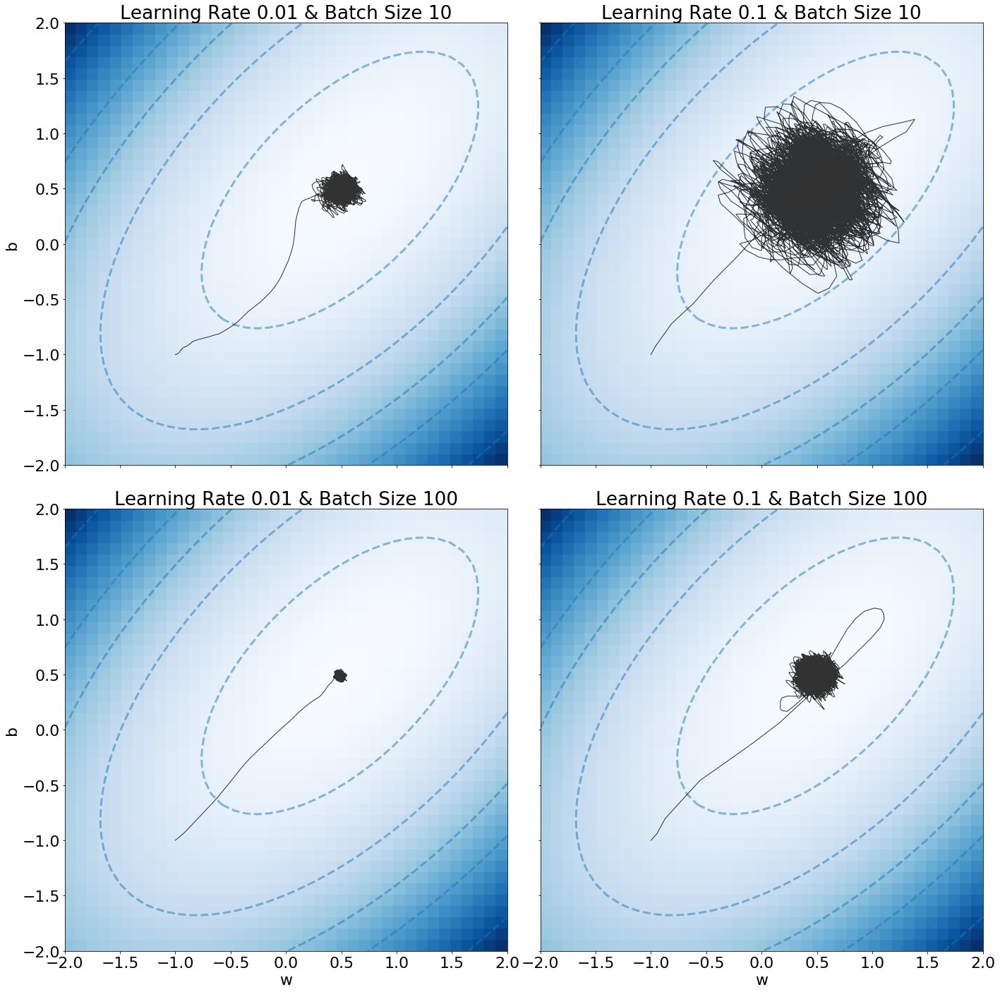

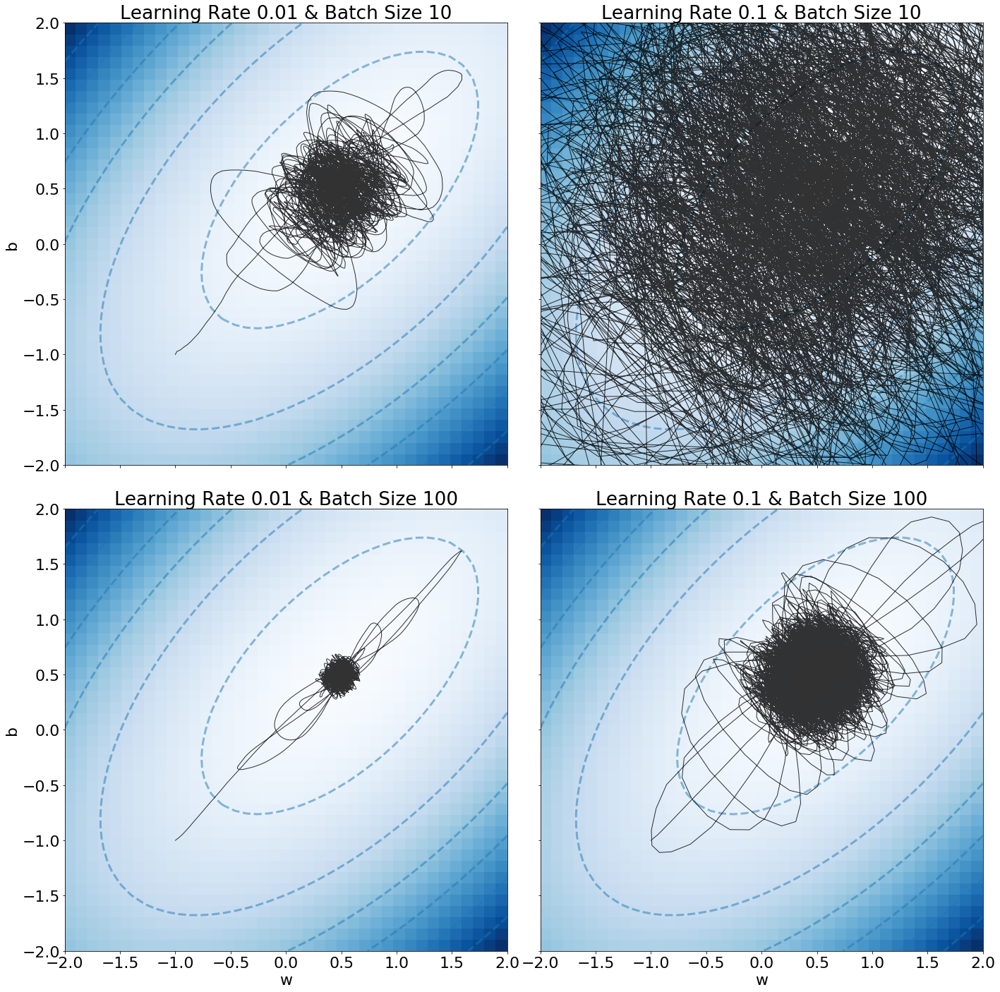

In [22]:
def loss(W1, W2, X, Y):
    Phi = np.zeros_like(W1)
    for i in range(n):
        Phi += 0.5 * (Y[i] - (W1*X[i] + W2))**2
    return Phi/n
    
W1, W2 = np.meshgrid(np.linspace(-2, 2, 40), np.linspace(-2, 2, 40))
X, Y = dataset(n, angle, 4, w, b)
Phi = loss(W1, W2, X, Y)

for mom in [0.9,0.99]:
    fig, ax = plt.subplots(2, 2, figsize=(20,20), sharex=True, sharey=True)
    for i, bs in enumerate([10,100]):
        for j, lr in enumerate([1e-2, 1e-1]):
            x1, x2, v1, v2 = momentum(x10, x20, X, Y, lr, mom, bs, lamb, steps, iterative)
            ax[i,j].plot(x1, x2, color='k', alpha=0.8, lw=1)
            ax[i,j].contour(W1, W2, Phi, colors=[plt.cm.tab10(0)], alpha=0.5, linestyles='dashed', linewidths=3)
            ax[i,j].pcolormesh(W1, W2, Phi, cmap='Blues')
            ax[i,j].set_title('Learning Rate {} & Batch Size {}'.format(lr, bs))
            ax[i,j].set_xlim([-2,2])
            ax[i,j].set_ylim([-2,2])
            if i == 1:
                ax[i,j].set_xlabel('w')
            if j == 0:
                ax[i,j].set_ylabel('b')
    plt.tight_layout()
    plt.savefig('lr-bs-mom{}.png'.format(mom), format='png', bbox_inches='tight', transparent=True)

## Weight Decay Experiment

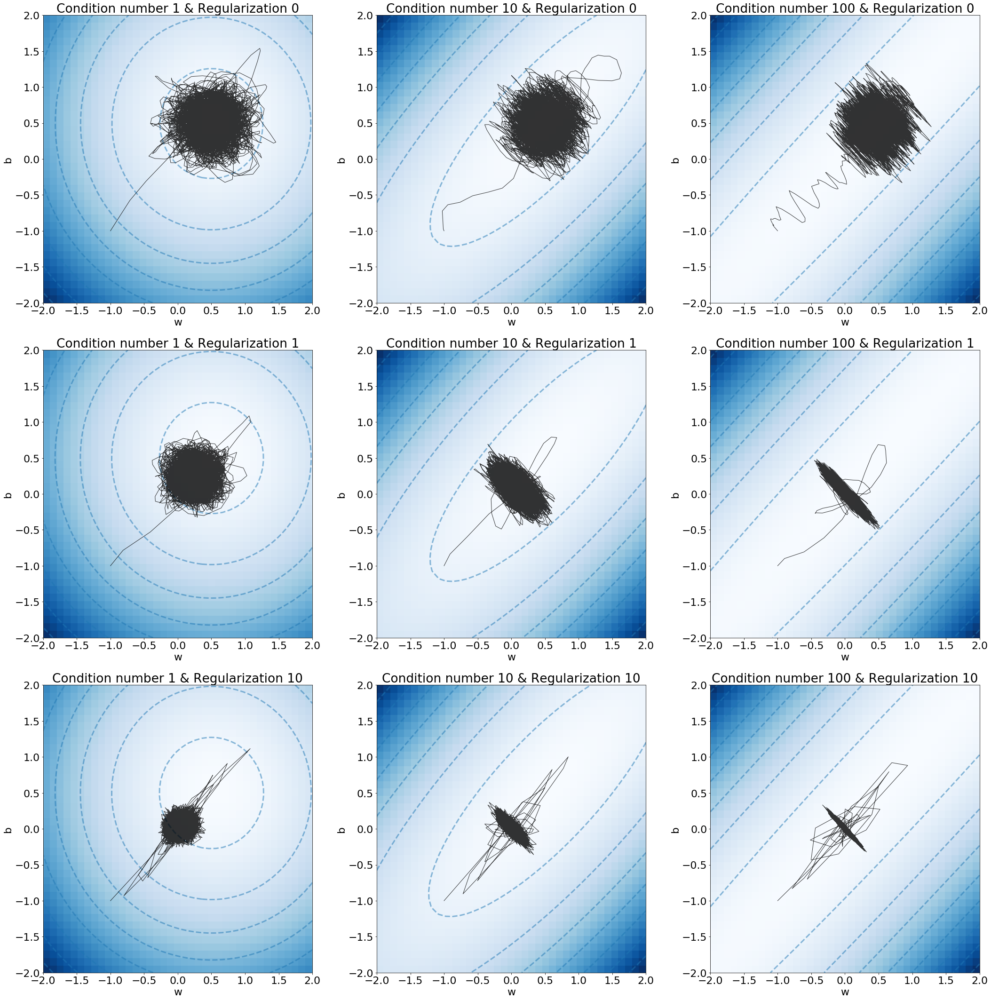

In [5]:
def loss(W1, W2, X, Y, lamb):
    Phi = np.zeros_like(W1)
    for i in range(n):
        Phi += 0.5 * (Y[i] - (W1*X[i] + W2))**2
    return Phi/n + 0.5 * lamb * (W1**2 + W2**2)
    
W1, W2 = np.meshgrid(np.linspace(-2, 2, 40), np.linspace(-2, 2, 40))

fig, ax = plt.subplots(3, 3, figsize=(30,30))

for i, lamb in enumerate([0, 1,10]):
    for j, c in enumerate([1,10,100]):
        X, Y = dataset(n, angle, c, w, b)
        x1, x2, v1, v2 = momentum(x10, x20, X, Y, eta, beta, s, lamb, steps, iterative)
        ax[i,j].plot(x1, x2, color='k', alpha=0.8, lw=1)
        Phi = loss(W1, W2, X, Y, 0)
        ax[i,j].contour(W1, W2, Phi, colors=[plt.cm.tab10(0)], alpha=0.5, linestyles='dashed', linewidths=3)
        ax[i,j].pcolormesh(W1, W2, Phi, cmap='Blues')
        ax[i,j].set_xlabel('w')
        ax[i,j].set_ylabel('b')
        ax[i,j].set_title('Condition number {} & Regularization {}'.format(c, lamb))

plt.tight_layout()
plt.savefig('weight-decay.png'.format(c), format='png', bbox_inches='tight', transparent=True)

### Setup for following experiments

In [32]:
# Data Setup
n = 10000
angle = 45
condition = 10
w = 0.5
b = 0.5
X, Y = dataset(n, angle, condition, w, b)

# Optimization Hyperparameters
x10 = -1
x20 = -1
eta = 1e-1
beta = 0.9
s = 10
lamb = 0
steps = 10000

# Run SGD
x1, x2, v1, v2 = momentum(x10, x20, X, Y, eta, beta, s, lamb, steps, iterative)

## Modified Potential

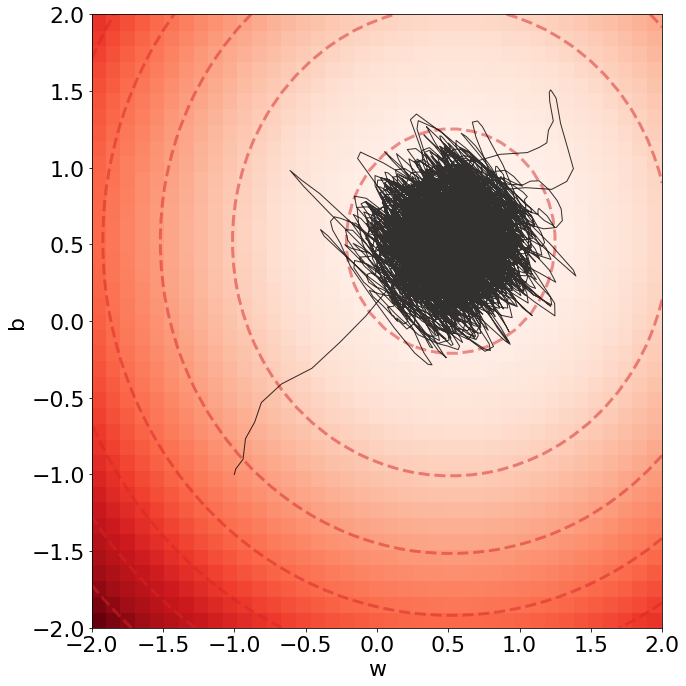

In [33]:
G = np.vstack((X,np.ones(n)))
A = G.dot(G.T) / n
Ainv = np.linalg.inv(A)
B = np.array([np.dot(X,Y), np.sum(Y)]) / n
sol = Ainv.dot(B)

fig, ax = plt.subplots(1, 1, figsize=(10,10))

ax.plot(x1, x2, color='k', alpha=0.8, lw=1)

W1, W2 = np.meshgrid(np.linspace(-2, 2, 40), np.linspace(-2, 2, 40))
Psi_x = 0.5 * (W1**2 + W2**2) - W1*sol[0] - W2*sol[1]
Psi_x *= 4*(1-beta) / (eta**2 * (1+beta)**2)

ax.contour(W1, W2, Psi_x, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax.pcolormesh(W1, W2, Psi_x, cmap='Reds')

ax.set_xlabel('w')
ax.set_ylabel('b')

plt.tight_layout()
plt.savefig('position-modified-potential.png', format='png', bbox_inches='tight', transparent=True)

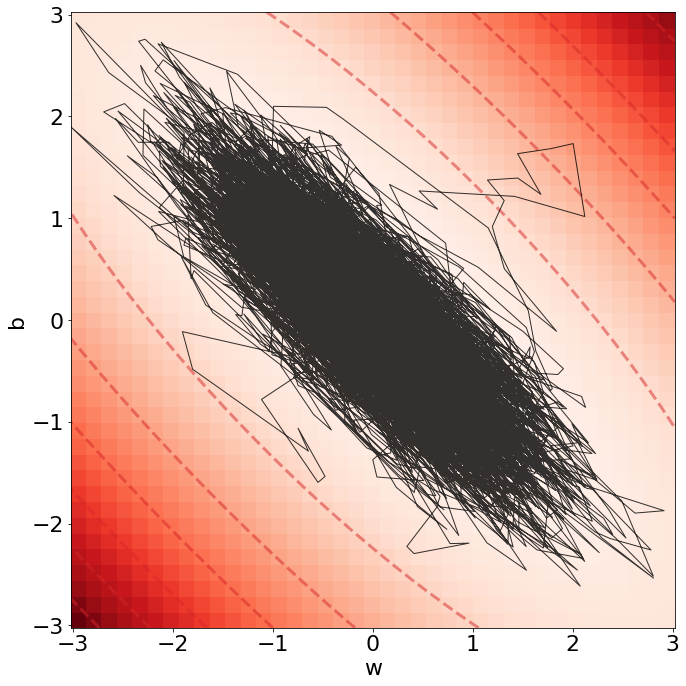

In [34]:
G = np.vstack((X,np.ones(n)))
A = G.dot(G.T) / n
Ainv = np.linalg.inv(A)
B = np.array([np.dot(X,Y), np.sum(Y)]) / n
sol = Ainv.dot(B)

fig, ax = plt.subplots(1, 1, figsize=(10,10))

ax.plot(v1, v2, color='k', alpha=0.8, lw=1)

vlim = max([max(np.abs(v1)), max(np.abs(v2))])
V1, V2 = np.meshgrid(np.linspace(-vlim, vlim, 40), np.linspace(-vlim, vlim, 40))
Psi_v = 0.5 * (Ainv[0,0]*V1**2 + Ainv[1,1]*V2**2 + (Ainv[1,0]+Ainv[0,1])*V1*V2)
Psi_v *= 2 * (1 - beta) / (eta * (1+beta))
ax.contour(V1, V2, Psi_v, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax.pcolormesh(V1, V2, Psi_v, cmap='Reds')

ax.set_xlabel('w')
ax.set_ylabel('b')

plt.tight_layout()
plt.savefig('velocity-modified-potential.png', format='png', bbox_inches='tight', transparent=True)

## Probability Current

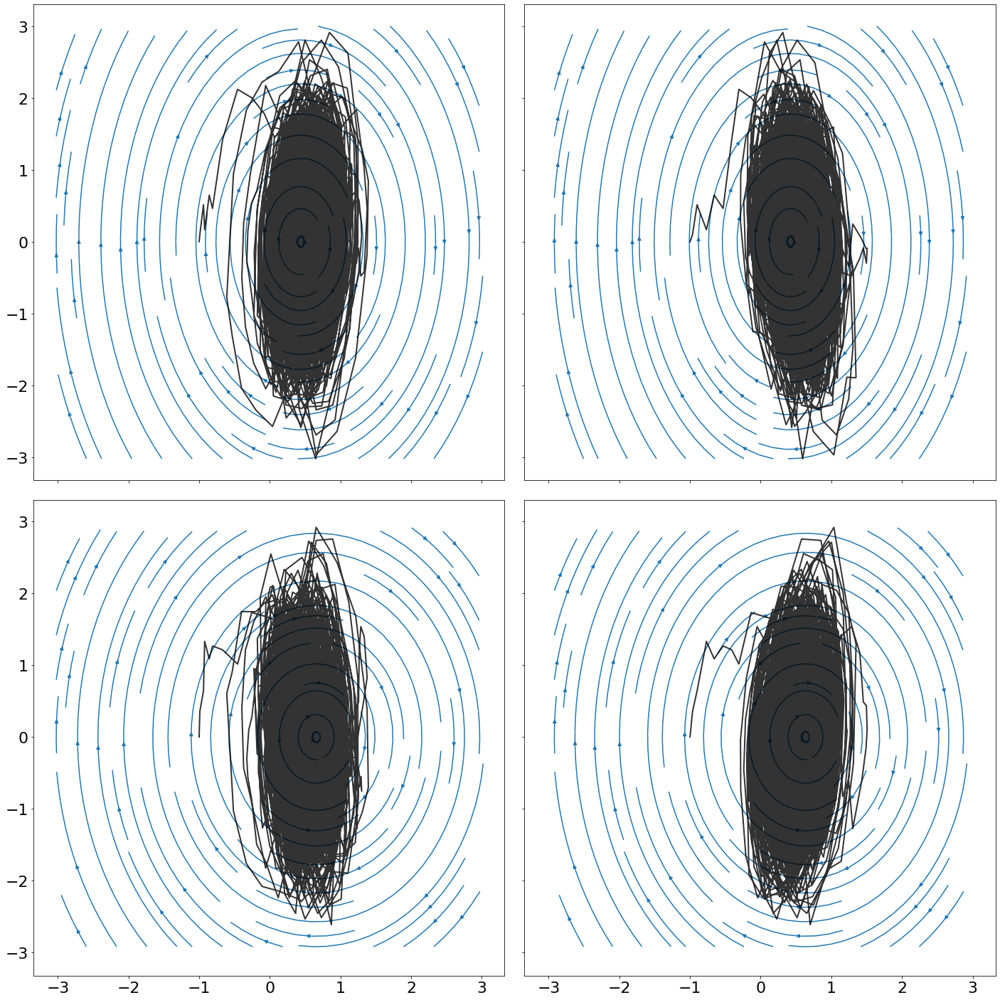

In [35]:
fig, ax = plt.subplots(2, 2, figsize=(20,20), sharex=True, sharey=True)

ax[0,0].plot(x1, v1, color='k', alpha=0.8, lw=2)
ax[0,1].plot(x2, v1, color='k', alpha=0.8, lw=2)
ax[1,0].plot(x1, v2, color='k', alpha=0.8, lw=2)
ax[1,1].plot(x2, v2, color='k', alpha=0.8, lw=2)

lim1 = max([max(np.abs(x1)), max(np.abs(v1))])
lim2 = max([max(np.abs(x2)), max(np.abs(v2))])

X1, V1 = np.meshgrid(np.linspace(-lim1, lim1, 40), np.linspace(-lim1, lim1, 40))
X2, V2 = np.meshgrid(np.linspace(-lim2, lim2, 40), np.linspace(-lim2, lim2, 40))

G1 = np.zeros_like(X1)
G2 = np.zeros_like(X2)
for i in range(n):
    G1 += X[i] * (X1 * X[i] + X2 - Y[i])
    G2 += (X1 * X[i] + X2 - Y[i])
G1 *= -2/(n*eta*(1+beta))
G2 *= -2/(n*eta*(1+beta))


ax[0,0].streamplot(X1, V1, V1, G1, cmap='Blues')
ax[0,1].streamplot(X2, V1, V2, G1, cmap='Blues')
ax[1,0].streamplot(X1, V2, V1, G2, cmap='Blues')
ax[1,1].streamplot(X2, V2, V2, G2, cmap='Blues')

plt.tight_layout()
plt.savefig('probability-current.png', format='png', bbox_inches='tight', transparent=True)

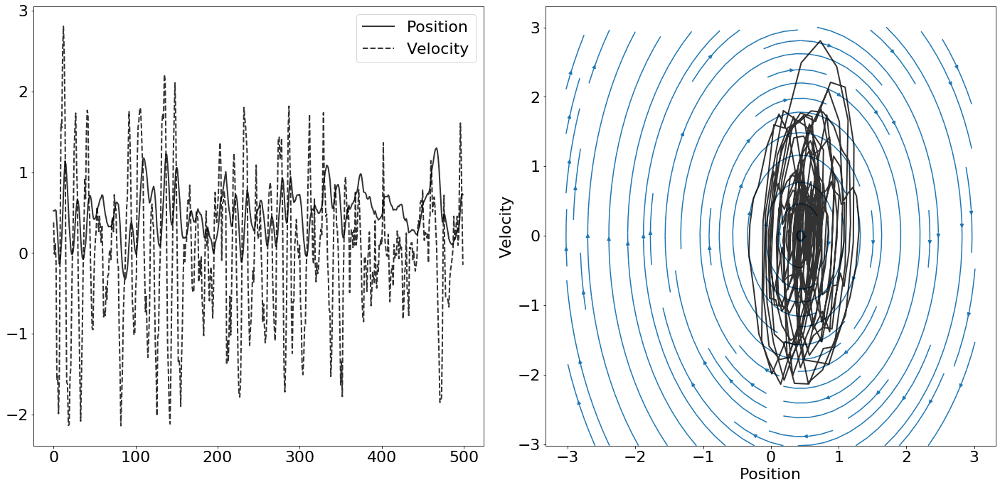

In [37]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

k = 500
ax[0].plot(x1[-k:], color='k', ls='-', alpha=0.8, lw=2, label='Position')
ax[0].plot(v1[-k:], color='k', ls='--', alpha=0.8, lw=2, label='Velocity')
ax[0].legend()

ax[1].plot(x1[-k:], v1[-k:], color='k', alpha=0.8, lw=2)
ax[1].streamplot(X1, V1, V1, G1, cmap='Blues')

ax[1].set_xlabel('Position')
ax[1].set_ylabel('Velocity')

plt.tight_layout()
plt.savefig('weight-oscillations.png', format='png', bbox_inches='tight', transparent=True)

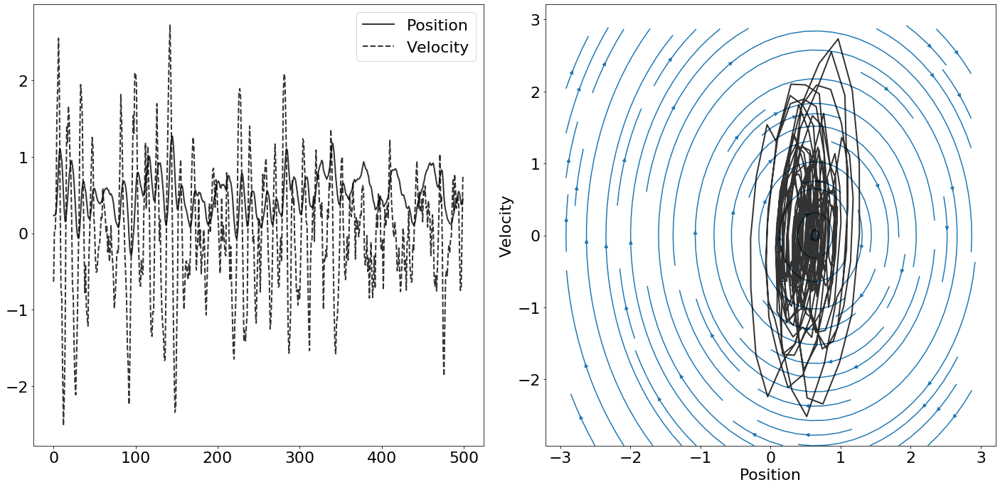

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

k = 500
ax[0].plot(x2[-k:], alpha=0.8, color='k', ls='-', lw=2, label='Position')
ax[0].plot(v2[-k:], alpha=0.8, color='k', ls='--', lw=2, label='Velocity')
ax[0].legend()

ax[1].plot(x2[-k:], v2[-k:], color='k', alpha=0.8, lw=2)
ax[1].streamplot(X2, V2, V2, G2, cmap='Blues')

ax[1].set_xlabel('Position')
ax[1].set_ylabel('Velocity')

plt.tight_layout()
plt.savefig('bias-oscillations.png', format='png', bbox_inches='tight', transparent=True)

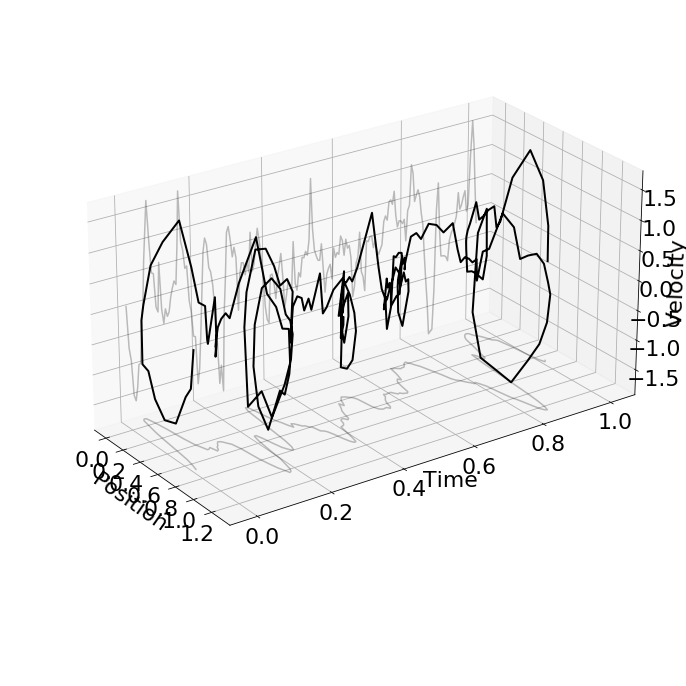

In [77]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')

k=200

time = np.linspace(0,1,k) 

ax.plot(x1[-k:], time, min(v1[-k:])*np.ones(k), color='k', alpha=0.25)
ax.plot(min(x1[-k:])*np.ones(k), time, v1[-k:], color='k', alpha=0.25)
ax.plot(x1[-k:], time, v1[-k:], lw=2, color='k')

ax.set_xlabel('Position')
ax.set_ylabel('Time')
ax.set_zlabel('Velocity')

ax.view_init(elev=25., azim=-35)
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([0.5, 1, 0.5, 0.75]))

plt.tight_layout()
plt.savefig('weight-oscillations-3d.png', format='png', bbox_inches='tight', transparent=True)

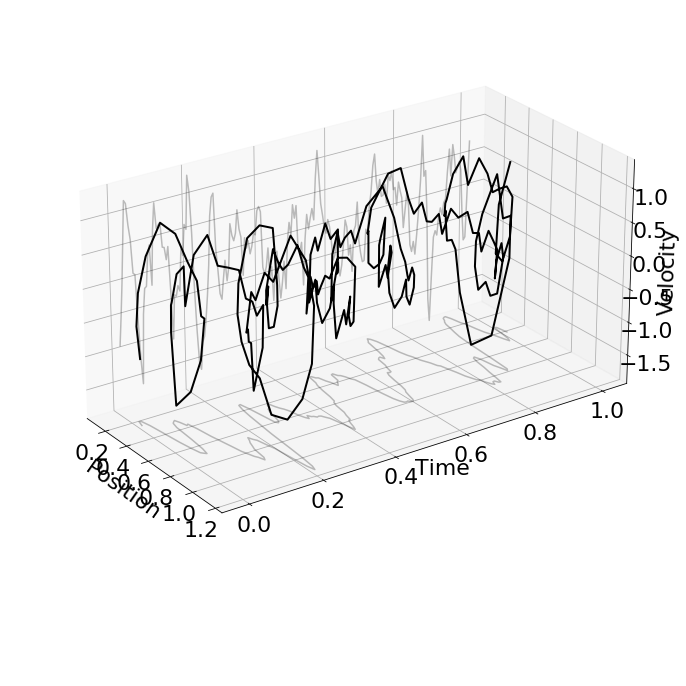

In [78]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')

k=200

time = np.linspace(0,1,k) 

ax.plot(x2[-k:], time, v2[-k:], lw=2, color='k')
ax.plot(x2[-k:], time, min(v2[-k:])*np.ones(k), color='k', alpha=0.25)
ax.plot(min(x2[-k:])*np.ones(k), time, v2[-k:], color='k', alpha=0.25)

ax.set_xlabel('Position')
ax.set_ylabel('Time')
ax.set_zlabel('Velocity')

ax.view_init(elev=25., azim=-35)
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([0.5, 1, 0.5, 0.75]))

plt.tight_layout()
plt.savefig('bias-oscillations-3d.png', format='png', bbox_inches='tight', transparent=True)

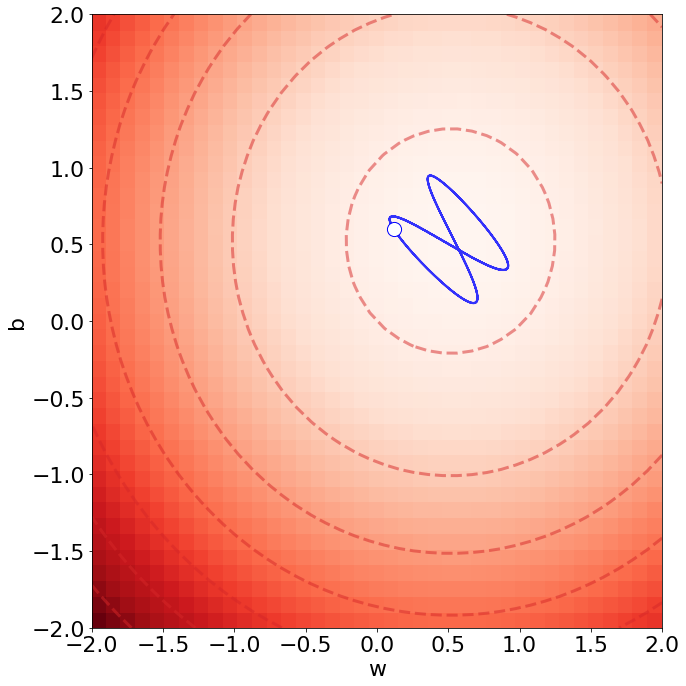

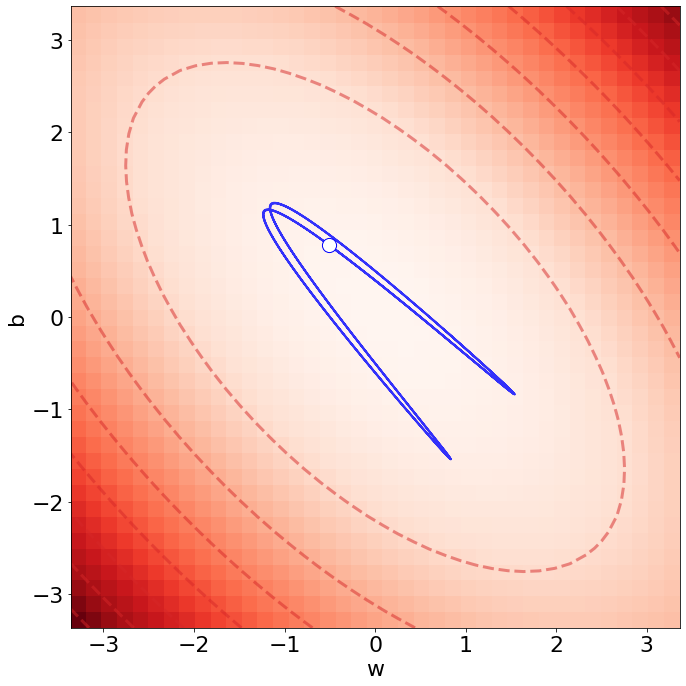

In [73]:
# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def trace_prob_current(w10, w20, v10, v20, steps=100000, delta=1e-4):
    w1 = [w10]
    w2 = [w20]
    v1 = [v10]
    v2 = [v20]
    for i in range(steps):    
        g1, g2 = gradient(w1[-1], w2[-1], X, Y, lamb)
        g1 *= -2/(eta*(1+beta))
        g2 *= -2/(eta*(1+beta))
        w1.append(w1[-1] + delta * v1[-1])
        w2.append(w2[-1] + delta * v2[-1])
        v1.append(v1[-1] + delta * g1)
        v2.append(v2[-1] + delta * g2)
    return w1, w2, v1, v2

G = np.vstack((X,np.ones(n)))
A = G.dot(G.T) / n
Ainv = np.linalg.inv(A)
B = np.array([np.dot(X,Y), np.sum(Y)]) / n
sol = Ainv.dot(B)

# Point to set initial conditions
k = 100

# Trace probability current
pw1, pw2, pv1, pv2 = trace_prob_current(x1[-k], x2[-k], v1[-k], v2[-k])



fig, ax = plt.subplots(1, 1, figsize=(10,10))

ax.scatter(x1[-k], x2[-k], s=200, facecolors='w', edgecolors='b', zorder=100)
ax.plot(pw1, pw2, color='b', alpha=0.8, lw=2)

W1, W2 = np.meshgrid(np.linspace(-2, 2, 40), np.linspace(-2, 2, 40))
Psi_x = 0.5 * (W1**2 + W2**2) - W1*sol[0] - W2*sol[1]
Psi_x *= 4*(1-beta) / (eta**2 * (1+beta)**2)

ax.contour(W1, W2, Psi_x, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax.pcolormesh(W1, W2, Psi_x, cmap='Reds')

ax.set_xlabel('w')
ax.set_ylabel('b')

plt.tight_layout()
plt.savefig('tracing_probability_current_position.png', format='png', bbox_inches='tight', transparent=True)


fig, ax = plt.subplots(1, 1, figsize=(10,10))

ax.scatter(v1[-k], v2[-k], s=200, facecolors='w', edgecolors='b', zorder=100)
ax.plot(pv1, pv2, color='b', alpha=0.8, lw=2)

vlim = max([max(np.abs(v1)), max(np.abs(v2))])
V1, V2 = np.meshgrid(np.linspace(-vlim, vlim, 40), np.linspace(-vlim, vlim, 40))
Psi_v = 0.5 * (Ainv[0,0]*V1**2 + Ainv[1,1]*V2**2 + (Ainv[1,0]+Ainv[0,1])*V1*V2)
Psi_v *= 2 * (1 - beta) / (eta * (1+beta))
ax.contour(V1, V2, Psi_v, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax.pcolormesh(V1, V2, Psi_v, cmap='Reds')

ax.set_xlabel('w')
ax.set_ylabel('b')

plt.tight_layout()
plt.savefig('tracing_probability_current_velocity.png', format='png', bbox_inches='tight', transparent=True)

## Stationary Solution

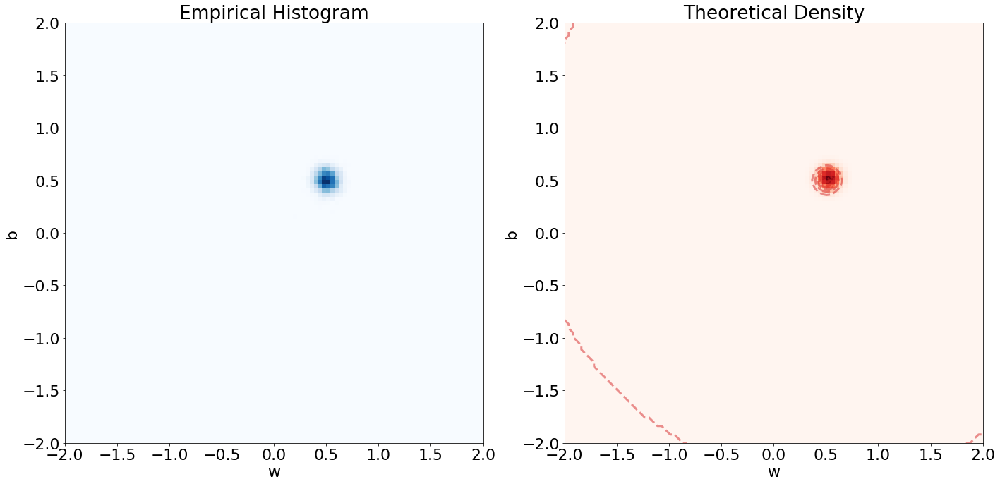

In [186]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

# Empirical Position
x1edges = np.linspace(-2,2,100)
x2edges = np.linspace(-2,2,100)
H, _, _ = np.histogram2d(x1, x2, bins=(x1edges, x2edges))
X1, X2 = np.meshgrid(x1edges, x2edges)
ax[0].pcolormesh(X1, X2, H.T, cmap='Blues')

# Theory position
W1, W2 = np.meshgrid(np.linspace(-2, 2, 100), np.linspace(-2, 2, 100))
Psi_x = 0.5 * (W1**2 + W2**2) - W1*sol[0] - W2*sol[1]
Psi_x *= 4*(1-beta) / (eta**2 * (1+beta)**2)
B = eta*s*(1 + beta)**2 / 2
pss = np.exp(-B*Psi_x)
ax[1].contour(W1, W2, pss, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[1].pcolormesh(W1, W2, pss, cmap='Reds')

ax[0].set_xlabel('w')
ax[0].set_ylabel('b')
ax[1].set_xlabel('w')
ax[1].set_ylabel('b')

ax[0].set_title('Empirical Histogram')
ax[1].set_title('Theoretical Density')

plt.tight_layout()
plt.savefig('position-stationary-solution.png', format='png', bbox_inches='tight', transparent=True)

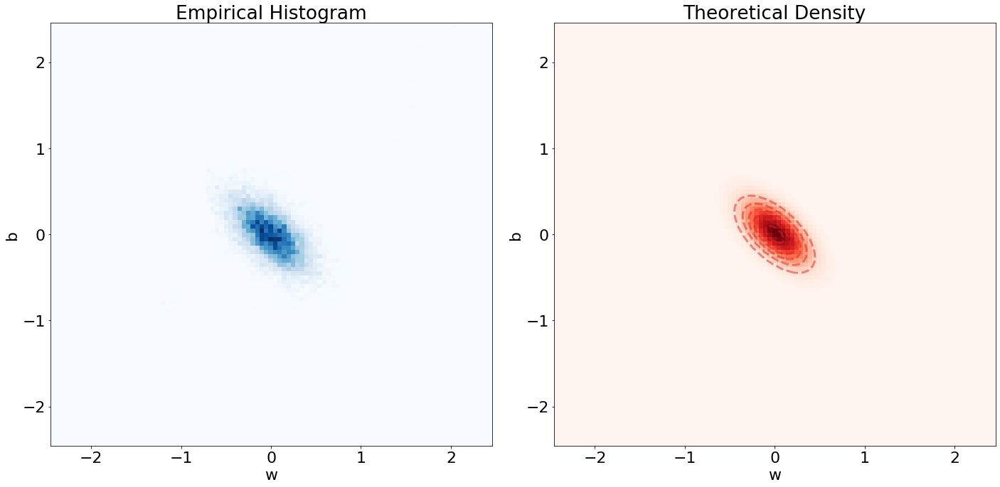

In [187]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

# Empirical Velocity
vlim = max([max(np.abs(v1)), max(np.abs(v2))])
xedges = np.linspace(-vlim,vlim,100)
yedges = np.linspace(-vlim,vlim,100)
H, _, _ = np.histogram2d(v1, v2, bins=(xedges, yedges))
X, Y = np.meshgrid(xedges, yedges)
ax[0].pcolormesh(X, Y, H.T, cmap='Blues')

# Theory velocity
V1, V2 = np.meshgrid(np.linspace(-vlim, vlim, 100), np.linspace(-vlim, vlim, 100))
Psi_v = 0.5 * (Ainv[0,0]*V1**2 + Ainv[1,1]*V2**2 + (Ainv[1,0]+Ainv[0,1])*V1*V2)
# Psi_v *= 2 * (1 - beta) / (eta * (1+beta))
# B = eta*s*(1 + beta)**2 / 2
# pss = np.exp(-B*Psi_v)
pss = np.exp(-s*(1-beta**2)*Psi_v)
ax[1].contour(V1, V2, pss, colors=[plt.cm.tab10(3)], alpha=0.5, linestyles='dashed', linewidths=3)
ax[1].pcolormesh(V1, V2, pss, cmap='Reds')

ax[0].set_xlabel('w')
ax[0].set_ylabel('b')
ax[1].set_xlabel('w')
ax[1].set_ylabel('b')

ax[0].set_title('Empirical Histogram')
ax[1].set_title('Theoretical Density')

plt.tight_layout()
plt.savefig('velocity-stationary-solution.png', format='png', bbox_inches='tight', transparent=True)

# Linear Regression with SGD

### Utility Functions

In [2]:
# Builds a random dataset such that when used in linear regression
# their is a certain SVD structure to the Hessian of the MSE loss
# n: number of data points
# d: dimension of data points
# angle: angle of major axis in degrees
# condition: condition number ratio of major and minor axis
# w: true weight vector
# b: true bias
# sigma: variance of error
def multivariate_dataset(n, d, condition, w, b, sigma=1.0):
    # Build Eigenvector matrix
    R = np.eye(d+1)

    # Build Eigenvector matrix
    Sigma = np.diag(np.linspace(np.sqrt(condition),1,d+1))

    # Build data matrix 
    Q, _ = np.linalg.qr(np.random.randn(n, d+1))
    X = Q.dot(Sigma).dot(R)

    # Project data matrix so last column is all one
    v = X[:,-1] - np.linalg.norm(X[:,-1]) / np.sqrt(n) * np.ones(n)
    H = np.eye(n) - 2 * np.outer(v, v) / np.linalg.norm(v)**2
    X = H.dot(X) * np.sqrt(n) / np.linalg.norm(X[:,-1])
    X = X[:,:-1]
    
    # Sample Output from data matrix
    eps = np.random.normal(0,sigma,n)
    Y = X.dot(w) + b + eps

    return X, Y

# Generator that samples batches randomly with/without replacement
# X: input dataset
# Y: output dataset
# s: batch size
# replace: whether to sample with/without replacement
def random(X, Y, s, replace=True):
    n = X.shape[0]
    while True:
        batch_idx = np.random.choice(n, s, replace=replace)
        x = X[batch_idx,:]
        y = Y[batch_idx]
        yield x,y 

# Generator that samples batch iteratively through the entire dataset
# X: input dataset
# Y: output dataset
# s: batch size
# shuffle: whether to shuffle the dataset between epochs
def iterative(X, Y, s, shuffle=True):
    n = X.shape[0]
    while True:
        idx = np.arange(n)
        if shuffle:
            np.random.shuffle(idx)
        for i in range(n // s):
            batch_idx = idx[s*i:s*(i+1)]
            x = X[batch_idx,:]
            y = Y[batch_idx]
            yield x, y

# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def gradient(w, b, x, y):
    m = np.shape(x)[0]
    dw = x.T.dot(x.dot(w) + b - y) / m
    db = np.mean(x.dot(w) + b - y)
    return dw, db

# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def momentum(w10, w20, X, Y, eta, beta, s, steps, sampler):
    w1 = [w10]
    w2 = [w20]
    V1 = [np.zeros_like(w10)]
    V2 = [0]
    G1 = [np.zeros_like(w10)]
    G2 = [0]
    v1 = 0
    v2 = 0
    dataloader = sampler(X, Y, s)
    for i in range(steps):
        x, y = next(dataloader)
        g1, g2 = gradient(w1[-1], w2[-1], x, y)
        v1 = beta * v1 + g1
        v2 = beta * v2 + g2
        w1.append(w1[-1] - eta * v1)
        w2.append(w2[-1] - eta * v2)
        V1.append(v1)
        V2.append(v2)
        G1.append(g1)
        G2.append(g2)
    return np.array(w1), np.array(w2), np.array(V1), np.array(V2), np.array(G1), np.array(G2)

### Setup

In [53]:
# Data Setup
n = 5000
d = 200
condition = 10
w = np.random.normal(0,1,d)
b = 0.5
X, Y = multivariate_dataset(n, d, condition, w, b)

# Optimization Hyperparameters
w0 = np.ones(d)
b0 = 1
eta = 1e-3
beta = 0.99
s = 500
steps = 10000

# Run SGD
x1, x2, v1, v2, g1, g2 = momentum(w0, b0, X, Y, eta, beta, s, steps, random)

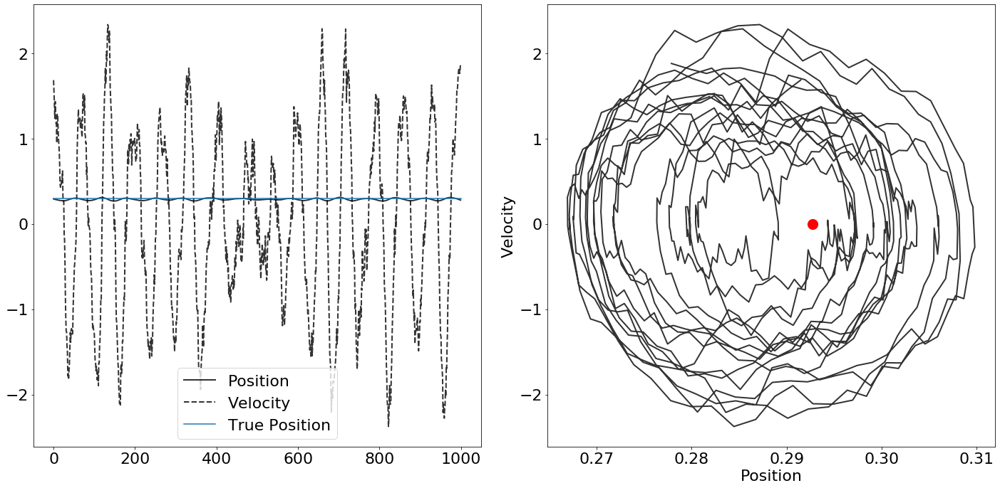

In [54]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

k = 1000
p = 10
ax[0].plot(x1[-k:,p], alpha=0.8, color='k', ls='-', lw=2, label='Position')
ax[0].plot(v1[-k:,p], alpha=0.8, color='k', ls='--', lw=2, label='Velocity')
ax[0].plot([0,k], [w[p],w[p]], label='True Position')
ax[0].legend()

ax[1].plot(x1[-k:,p], v1[-k:,p], color='k', alpha=0.8, lw=2)
ax[1].scatter(w[p],0, s=200, zorder=100, color='r')
# ax[1].streamplot(X2, V2, V2, G2, cmap='Blues')

ax[1].set_xlabel('Position')
ax[1].set_ylabel('Velocity')

plt.tight_layout()
# plt.savefig('bias-oscillations.png', format='png', bbox_inches='tight', transparent=True)

## Inner product

(array([ 7.,  2.,  2.,  2.,  2.,  3.,  6.,  7.,  4.,  8.,  6.,  6.,  8.,
         5.,  6.,  7., 10., 11.,  7.,  7.,  7.,  6.,  7.,  9.,  5., 12.,
        13., 11., 12., 13., 18., 24., 18., 20., 22., 19., 14., 17., 15.,
        13., 16., 11., 11., 20., 15., 19., 15., 14., 13., 13., 13., 10.,
        14., 11., 10., 14., 11., 11., 18., 14., 10., 20., 14., 22., 18.,
        19., 11., 16., 10., 15., 10., 16., 17., 19., 14., 13.,  9.,  9.,
         9.,  7.,  9.,  3.,  4.,  9.,  3.,  5.,  4.,  1.,  2.,  0.,  1.,
         2.,  1.,  2.,  0.,  2.,  1.,  2.,  2.,  5.]),
 array([10.61543012, 10.62484215, 10.63425419, 10.64366622, 10.65307826,
        10.66249029, 10.67190233, 10.68131436, 10.6907264 , 10.70013843,
        10.70955047, 10.7189625 , 10.72837454, 10.73778657, 10.74719861,
        10.75661064, 10.76602268, 10.77543471, 10.78484674, 10.79425878,
        10.80367081, 10.81308285, 10.82249488, 10.83190692, 10.84131895,
        10.85073099, 10.86014302, 10.86955506, 10.87896709, 10.888379

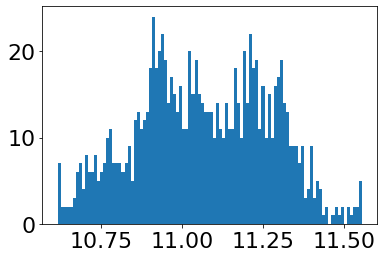

In [59]:
skip = 1000
X = np.hstack((x1, x2[:,np.newaxis]))
XT = X
XS = np.roll(X,skip,axis=1)
dot_prod = np.sum(XT * XS, axis=1)
plt.hist(dot_prod[-1000:],bins=100)

## PCA Plot

In [13]:
from sklearn.decomposition import PCA


def filter_outliers(projected_data, threshold):
    norms = np.linalg.norm(projected_data, axis=1)
    outlier_idx = np.where(norms > threshold)[0]
    keep_idx = np.where(norms <= threshold)[0]
    return outlier_idx, keep_idx


def fit_pca(fit_data, project_data=None, whiten=False):
    if project_data is None:
        project_data = fit_data
    pca_mod = PCA(whiten=whiten)
    pca_mod.fit(fit_data)
    projected = pca_mod.transform(project_data)
    return projected, pca_mod


def plot_pca(
    fit_data,
    axes,
    project_data=None,
    whiten=False,
    cbar=True,
    components=[0, 1],
    outlier_thresh=40,
):
    projected, pca_mod = fit_pca(fit_data, project_data, whiten)
    projected_fit_data = pca_mod.transform(fit_data)

    o_idx, k_idx = filter_outliers(projected_fit_data, outlier_thresh)
    while len(o_idx) > 0:
        print(o_idx)
        print(f"Refitting without {len(o_idx)} outliers")
        fit_data = fit_data[k_idx]
        projected, pca_mod = fit_pca(fit_data, project_data, whiten)
        projected_fit_data = pca_mod.transform(fit_data)

        o_idx, k_idx = filter_outliers(projected_fit_data, outlier_thresh)

    # Plot
    cm = plt.get_cmap("viridis")
    num_points = projected.shape[0]
    col = [cm(float(i) / (num_points)) for i in range(num_points)]

    axes.scatter(projected[:, components[0]], projected[:, components[1]], c=col)
#     axes.plot(projected[:, components[0]])
#     axes.plot(projected[:, components[1]])
    axes.set_xlabel(
        f"PC {components[0]+1} "
        f"({pca_mod.explained_variance_ratio_[components[0]]:0.4f} e.v.)"
    )
    axes.set_ylabel(
        f"PC {components[1]+1} "
        f"({pca_mod.explained_variance_ratio_[components[1]]:0.4f} e.v.)"
    )
    if cbar:
        add_cbar(cm, range(3), axes)
        
def plot_pca_phase(
    fit_data,
    axes,
    project_data=None,
    whiten=False,
    cbar=True,
    component=[0],
    outlier_thresh=40,
):
    projected, pca_mod = fit_pca(fit_data, project_data, whiten)
    projected_fit_data = pca_mod.transform(fit_data)

    o_idx, k_idx = filter_outliers(projected_fit_data, outlier_thresh)
    while len(o_idx) > 0:
        print(o_idx)
        print(f"Refitting without {len(o_idx)} outliers")
        fit_data = fit_data[k_idx]
        projected, pca_mod = fit_pca(fit_data, project_data, whiten)
        projected_fit_data = pca_mod.transform(fit_data)

        o_idx, k_idx = filter_outliers(projected_fit_data, outlier_thresh)

    # Plot
    cm = plt.get_cmap("viridis")
    num_points = projected.shape[0]
    col = [cm(float(i) / (num_points)) for i in range(num_points)]

    axes.scatter(projected_fit_data[:, component], projected[:, component], c=col)
    axes.set_xlabel(
        f"PC {component+1} fit data"
        f"({pca_mod.explained_variance_ratio_[component]:0.4f} e.v.)"
    )
    axes.set_ylabel(
        f"PC {component+1} projected data"
        f"({pca_mod.explained_variance_ratio_[component]:0.4f} e.v.)"
    )
    if cbar:
        add_cbar(cm, range(3), axes)

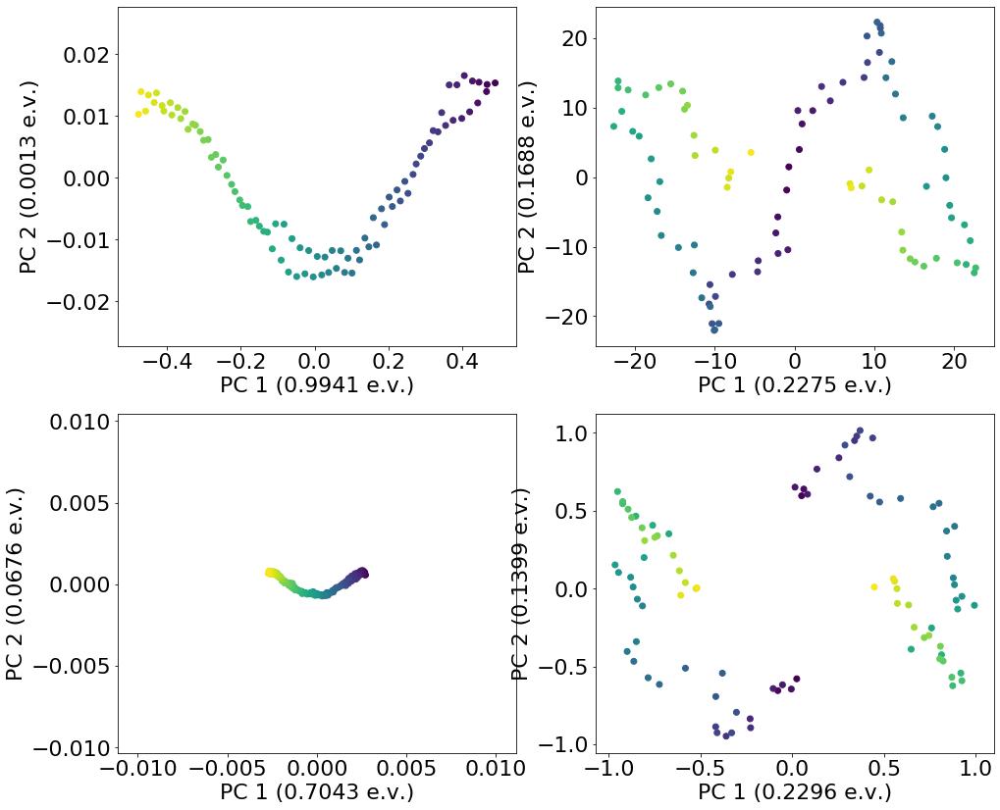

In [105]:
nrows = 2
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
position = np.hstack((x1,np.expand_dims(x2,1)))
velocity = np.hstack((v1,np.expand_dims(v2,1)))

k = 90

plot_pca(position[:k,], axes[0,0], components=[0, 1], cbar=False)
plot_pca(velocity[:k,], axes[0,1], components=[0, 1], cbar=False, outlier_thresh=1e19)
# plot_pca_phase(position[:k,], axes[0,1], velocity[:k,], component=0, cbar=False)

plot_pca(position[-k:,], axes[1,0], components=[0, 1], cbar=False)
plot_pca(velocity[-k:,], axes[1,1], components=[0, 1], cbar=False, outlier_thresh=1e19)
# plot_pca_phase(position[-k:,], axes[1,1], velocity[-k:,], component=0, cbar=False)

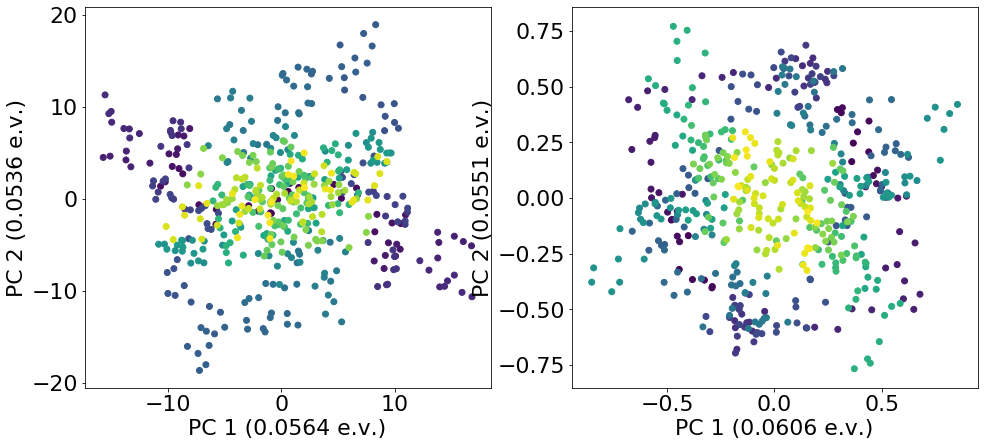

In [106]:
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
position = np.hstack((x1,np.expand_dims(x2,1)))
velocity = np.hstack((v1,np.expand_dims(v2,1)))
# velocity *= -2 / (eta * (1 + beta))

# position[1:,] /= np.expand_dims(np.linalg.norm(position[1:,], axis=1), 1)
# velocity[1:,] /= np.expand_dims(np.linalg.norm(velocity[1:,], axis=1), 1)
# position[1:,] /= np.linalg.norm(position[1:,], axis=0)
# velocity[1:,] /= np.linalg.norm(velocity[1:,], axis=0)

phase = np.hstack((position,velocity))

k = 500

plot_pca(phase[:k,], axes[0], components=[0, 1], cbar=False, outlier_thresh=1e19)#, whiten=True)

plot_pca(phase[-k:,], axes[1], components=[0, 1], cbar=False, outlier_thresh=1e19)#, whiten=True)

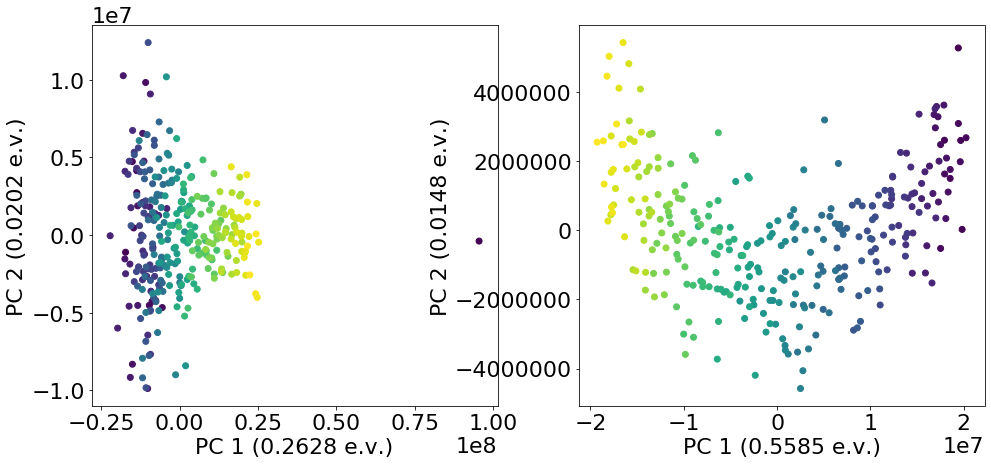

In [36]:
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
position = np.hstack((x1,np.expand_dims(x2,1)))
velocity = np.hstack((v1,np.expand_dims(v2,1)))
gradients = np.hstack((g1,np.expand_dims(g2,1)))
gradients *= -2 / (eta * (1 + beta))

phase = np.hstack((velocity,gradients))

# delta = 1e-5
# position_trace = position + delta * velocity
# velocity_trace = velocity + delta * gradients

# phase = np.hstack((position_trace,velocity_trace))


k = 300

plot_pca(phase[:k,], axes[0], components=[0, 1], cbar=False, outlier_thresh=1e19)

plot_pca(phase[-k:,], axes[1], components=[0, 1], cbar=False, outlier_thresh=1e19)

# Scalar Linear NN

### Utility Functions

In [79]:
# Builds a random dataset such that when used in linear regression
# their is a certain SVD structure to the Hessian of the MSE loss
# n: number of data points
# angle: angle of major axis in degrees
# condition: condition number ratio of major and minor axis
# w: true weight
# b: true bias
# sigma: variance of error
def dataset(n, condition, w1, w2, sigma=1.0):
    # Build Eigenvector matrix
    theta = np.radians(angle)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c, -s), (s, c)))

    # Build Eigenvector matrix
    Sigma = np.diag(np.array([np.sqrt(condition),1]))

    # Build data matrix 
    Q, _ = np.linalg.qr(np.random.randn(n, 2))
    X = Q.dot(Sigma).dot(R)

    # Project data matrix so second column is all one
    v = X[:,1] - np.linalg.norm(X[:,1]) / np.sqrt(n) * np.ones(n)
    H = np.eye(n) - 2 * np.outer(v, v) / np.linalg.norm(v)**2
    X = H.dot(X) * np.sqrt(n) / np.linalg.norm(X[:,1])
    X = X[:,0]
    
    # Sample Output from data matrix
    eps = np.random.normal(0,sigma,n)
    Y = w*X + b + eps

    return X, Y

# Generator that samples batches randomly with/without replacement
# X: input dataset
# Y: output dataset
# s: batch size
# replace: whether to sample with/without replacement
def random(X, Y, s, replace=True):
    n = X.shape[0]
    while True:
        batch_idx = np.random.choice(n, s, replace=replace)
        x = X[batch_idx]
        y = Y[batch_idx]
        yield x,y 

# Generator that samples batch iteratively through the entire dataset
# X: input dataset
# Y: output dataset
# s: batch size
# shuffle: whether to shuffle the dataset between epochs
def iterative(X, Y, s, shuffle=True):
    n = X.shape[0]
    while True:
        idx = np.arange(n)
        if shuffle:
            np.random.shuffle(idx)
        for i in range(n // s):
            batch_idx = idx[s*i:s*(i+1)]
            x = X[batch_idx]
            y = Y[batch_idx]
            yield x, y

# Return gradient on MSE loss
def gradient(w1, w2, x, y, lamb):
    dw1 = np.mean(w2 * x * (w1 * w2 * x - y) + lamb * w1)
    dw2 = np.mean(w1 * x * (w1 * w2 * x - y) + lamb * w2)
    return dw1, dw2

# Return gradient on MSE loss
def momentum(w10, w20, x, y, eta, beta, s, lamb, steps, sampler):
    w1 = [w10]
    w2 = [w20]
    V1 = [0]
    V2 = [0]
    v1 = 0
    v2 = 0
    dataloader = sampler(X, Y, s)
    for i in range(steps):
        x, y = next(dataloader)
        g1, g2 = gradient(w1[-1], w2[-1], x, y, lamb)
        v1 = beta * v1 + g1
        v2 = beta * v2 + g2
        w1.append(w1[-1] - eta * v1)
        w2.append(w2[-1] - eta * v2)
        V1.append(-v1)
        V2.append(-v2)
    return w1, w2, V1, V2

# Return MSE loss
def loss(w1, w2, x, y, lamb):
    n = np.shape(x)[0]
    L = 0
    for i in range(n):
        L += 0.5 * (w2 * w1 * x[i] - y[i])**2 + 0.5 * lamb * (w1**2 + w2**2)
    return L/n

### Setup

In [134]:
# Data Setup
n = 10000
angle = 45
condition = 4
w = 0.5
b = 0.5
X, Y = dataset(n, angle, condition, w, b)

# Optimization Hyperparameters
x10 = -2
x20 = -1
eta = 1e-1
beta = 0.9
s = 20
lamb = 0
steps = 100000

# Run SGD
x1, x2, v1, v2 = momentum(x10, x20, X, Y, eta, beta, s, lamb, steps, iterative)

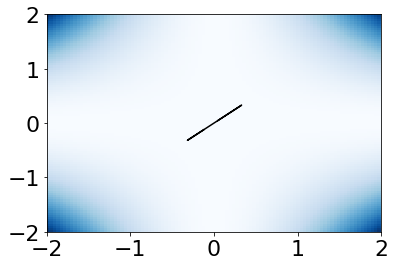

In [135]:
W1, W2 = np.meshgrid(np.linspace(-2, 2, 100), np.linspace(-2, 2, 100))
L = loss(W1, W2, X, Y, lamb)
# r = np.linspace(0.01,2,100)
# plt.plot(r, 1/r)
# plt.plot(-r, -1/r)
plt.plot(x1[10000:], x2[10000:], c='k')
plt.xlim((-2,2))
plt.ylim((-2,2))
plt.pcolormesh(W1, W2, L, cmap='Blues')

# Scrap Work

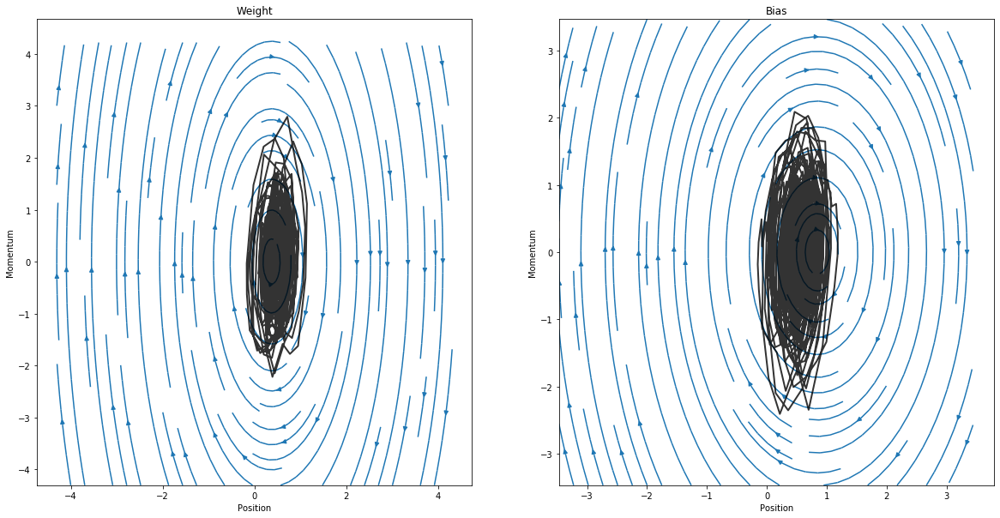

In [192]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

# x10 = -1
# x20 = -1
# eta = 1e-1
# beta = 0.0
# s = 10
# steps = 10000
# x1, x2, v1, v2 = momentum(x10, x20, X, Y, eta, beta, s, steps, iterative)


ims = []
m = 100
k = int(1000 / m)
for i in range(m):
    SDE1 = ax[0].plot(x1[9000:9000+k*(i)], v1[9000:9000+k*(i)], color='k', alpha=0.8, lw=2)
    SDE2 = ax[1].plot(x2[9000:9000+k*(i)], v2[9000:9000+k*(i)], color='k', alpha=0.8, lw=2)
    
    ims.append(SDE1 + SDE2)

lim1 = max([max(np.abs(x1)), max(np.abs(v1))])
lim2 = max([max(np.abs(x2)), max(np.abs(v2))])
# X1, V1 = np.meshgrid(np.linspace(min(x1), max(x1), 40), np.linspace(min(v1), max(v1), 40))
# X2, V2 = np.meshgrid(np.linspace(min(x2), max(x2), 40), np.linspace(min(v2), max(v2), 40))
X1, V1 = np.meshgrid(np.linspace(-lim1, lim1, 40), np.linspace(-lim1, lim1, 40))
X2, V2 = np.meshgrid(np.linspace(-lim2, lim2, 40), np.linspace(-lim2, lim2, 40))
G1 = np.zeros_like(X1)
G2 = np.zeros_like(X2)
for i in range(n):
    G1 += X[i] * (X1 * X[i] + X2 - Y[i])
    G2 += (X1 * X[i] + X2 - Y[i])
G1 *= -2/(n*eta*(1+beta))
G2 *= -2/(n*eta*(1+beta))


ax[0].streamplot(X1, V1, V1, G1, cmap='Blues')
ax[1].streamplot(X2, V2, V2, G2, cmap='Blues')

ax[0].set_title('Weight')
ax[0].set_xlabel('Position')
ax[0].set_ylabel('Momentum')

ax[1].set_title('Bias')
ax[1].set_xlabel('Position')
ax[1].set_ylabel('Momentum')


ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat_delay=500)

ani.save("OU.gif", writer='imagemagick')


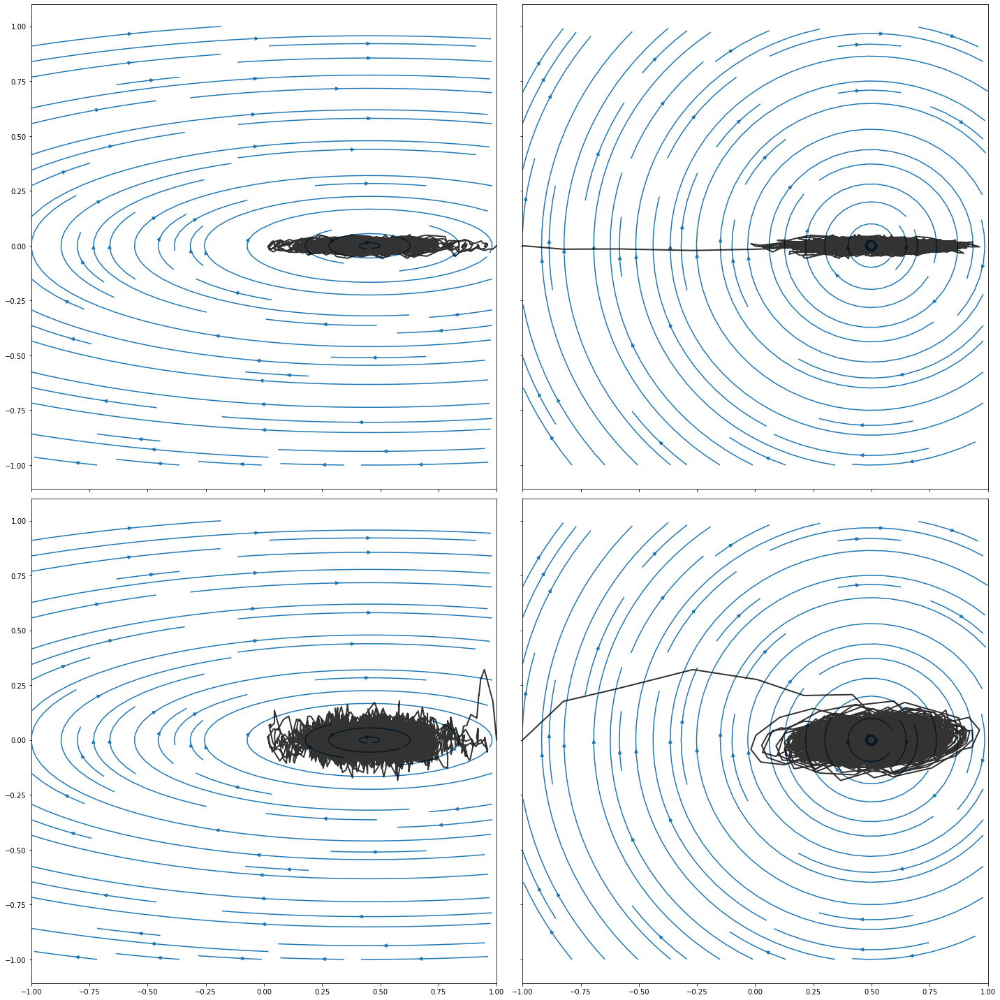

In [95]:
fig, ax = plt.subplots(2, 2, figsize=(20,20), sharex=True, sharey=True)

x10 = 1
x20 = -1
eta = 1e-1
beta = 0.7
s = 10
steps = 10000
x1, x2, v1, v2 = momentum(x10, x20, eta, beta, s, steps, iterative)


ax[0,0].plot(x1, v1, color='k', alpha=0.8, lw=2)
ax[0,1].plot(x2, v1, color='k', alpha=0.8, lw=2)
ax[1,0].plot(x1, v2, color='k', alpha=0.8, lw=2)
ax[1,1].plot(x2, v2, color='k', alpha=0.8, lw=2)

lim1 = max([max(np.abs(x1)), max(np.abs(v1))])
lim2 = max([max(np.abs(x2)), max(np.abs(v2))])
# X1, V1 = np.meshgrid(np.linspace(min(x1), max(x1), 40), np.linspace(min(v1), max(v1), 40))
# X2, V2 = np.meshgrid(np.linspace(min(x2), max(x2), 40), np.linspace(min(v2), max(v2), 40))
X1, V1 = np.meshgrid(np.linspace(-lim1, lim1, 40), np.linspace(-lim1, lim1, 40))
X2, V2 = np.meshgrid(np.linspace(-lim2, lim2, 40), np.linspace(-lim2, lim2, 40))

G1 = np.zeros_like(X1)
G2 = np.zeros_like(X2)
for i in range(n):
    G1 += X[i] * (X1 * X[i] + X2 - Y[i])
    G2 += (X1 * X[i] + X2 - Y[i])
G1 /= n
G2 /= n


ax[0,0].streamplot(X1, V1, V1, -G1, cmap='Blues')
ax[0,1].streamplot(X2, V1, V1, -G2, cmap='Blues')
ax[1,0].streamplot(X1, V2, V2, -G1, cmap='Blues')
ax[1,1].streamplot(X2, V2, V2, -G2, cmap='Blues')

plt.tight_layout()

# PCA plots

In [60]:
from sklearn.decomposition import PCA


def filter_outliers(projected_data, threshold):
    norms = np.linalg.norm(projected_data, axis=1)
    outlier_idx = np.where(norms > threshold)[0]
    keep_idx = np.where(norms <= threshold)[0]
    return outlier_idx, keep_idx


def fit_pca(fit_data, project_data=None, whiten=False):
    if project_data is None:
        project_data = fit_data
    pca_mod = PCA(whiten=whiten)
    pca_mod.fit(fit_data)
    projected = pca_mod.transform(project_data)
    return projected, pca_mod


def plot_pca(
    fit_data,
    axes,
    project_data=None,
    whiten=False,
    cbar=True,
    components=[0, 1],
    outlier_thresh=40,
):
    projected, pca_mod = fit_pca(fit_data, project_data, whiten)
    projected_fit_data = pca_mod.transform(fit_data)

    o_idx, k_idx = filter_outliers(projected_fit_data, outlier_thresh)
    while len(o_idx) > 0:
        print(o_idx)
        print(f"Refitting without {len(o_idx)} outliers")
        fit_data = fit_data[k_idx]
        projected, pca_mod = fit_pca(fit_data, project_data, whiten)
        projected_fit_data = pca_mod.transform(fit_data)

        o_idx, k_idx = filter_outliers(projected_fit_data, outlier_thresh)

    # Plot
    cm = plt.get_cmap("viridis")
    num_points = projected.shape[0]
    col = [cm(float(i) / (num_points)) for i in range(num_points)]

#     axes.scatter(projected[:, components[0]], projected[:, components[1]], c=col)
    axes.plot(projected[:, components[0]])
    axes.plot(projected[:, components[1]])
#     axes.set_xlabel(
#         f"PC {components[0]+1} "
#         f"({pca_mod.explained_variance_ratio_[components[0]]:0.4f} e.v.)"
#     )
#     axes.set_ylabel(
#         f"PC {components[1]+1} "
#         f"({pca_mod.explained_variance_ratio_[components[1]]:0.4f} e.v.)"
#     )
#     if cbar:
#         add_cbar(cm, range(3), axes)

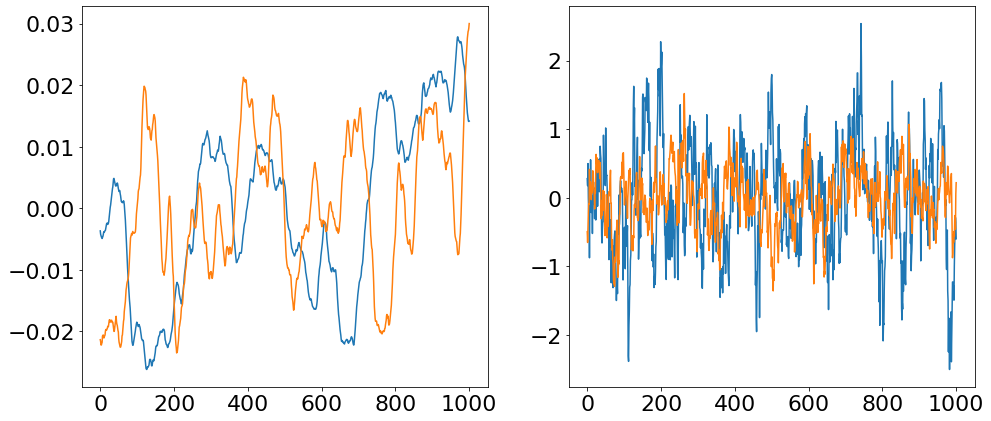

In [64]:
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
position = np.vstack((x1,x2)).T
velocity = np.vstack((v1,v2)).T
plot_pca(position[9000:], axes[0], components=[0, 1], cbar=False)
plot_pca(velocity[9000:], axes[1], components=[0, 1], cbar=False)

In [124]:
# Return gradient on MSE loss
def gradient(w1, w2, x, y, lamb):
    dw1 = w2 * x * (w1 * w2 * x - y) + lamb * w1
    dw2 = w1 * x * (w1 * w2 * x - y) + lamb * w2
    return dw1, dw2

# Return gradient on MSE loss
def momentum(w10, w20, x, y, eta, beta, lamb, steps):
    w1 = [w10]
    w2 = [w20]
    V1 = [0]
    V2 = [0]
    v1 = 0
    v2 = 0
    for i in range(steps):
        g1, g2 = gradient(w1[-1], w2[-1], x, y, lamb)
        v1 = beta * v1 + g1
        v2 = beta * v2 + g2
        w1.append(w1[-1] - eta * v1)
        w2.append(w2[-1] - eta * v2)
        V1.append(-v1)
        V2.append(-v2)
    return w1, w2, V1, V2

# Return MSE loss
def loss(w1, w2, x, y, lamb):
    return 0.5 * (w2 * w1 * x - y)**2 + 0.5 * lamb * (w1**2 + w2**2)

# Return MSE loss
def eigenvalue(w1, w2, x, y, lamb):
    return  0.5 * (w1**2 + w2**2 + (w1**4 + w2**4 + 14*w1**2*w2**2 - 16*w1*w2 + 4)**0.5)

In [157]:
# Optimization Hyperparameters
w10 = 0.1
w20 = 0.3
x = 100
y = 100
eta = 1e-4
beta = 0.0
lamb = 1e-1
steps = 40000

# Run SGD
w1, w2, v1, v2 = momentum(w10, w20, x, y, eta, beta, lamb, steps)

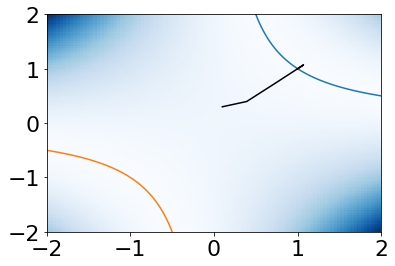

In [158]:
W1, W2 = np.meshgrid(np.linspace(-2, 2, 100), np.linspace(-2, 2, 100))
L = loss(W1, W2, x, y, lamb)
r = np.linspace(0.01,2,100)
plt.plot(r, 1/r)
plt.plot(-r, -1/r)
plt.plot(w1, w2, c='k')
plt.xlim((-2,2))
plt.ylim((-2,2))
plt.pcolormesh(W1, W2, L, cmap='Blues')

2.4326669228463773


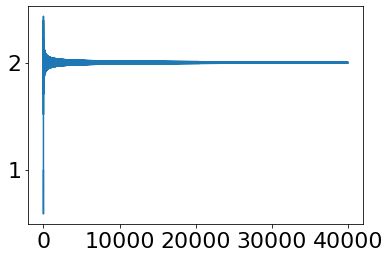

In [159]:
sharpening = eigenvalue(np.array(w1), np.array(w2), x, y, lamb)
plt.plot(sharpening)
print(max(sharpening))

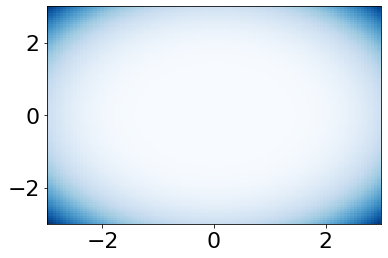

In [3]:
W1, W2 = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
L = 0.5*(1 - (W1**2 + W2**2))**2
r = np.linspace(0.01,2,100)
plt.pcolormesh(W1, W2, L, cmap='Blues')

In [8]:
# Builds a random dataset such that when used in linear regression
# their is a certain SVD structure to the Hessian of the MSE loss
# n: number of data points
# d: dimension of data points
# angle: angle of major axis in degrees
# condition: condition number ratio of major and minor axis
# w: true weight vector
# b: true bias
# sigma: variance of error
def multivariate_dataset(n, d, condition, w, b, sigma=1.0):
    # Build Eigenvector matrix
    R = np.eye(d+1)

    # Build Eigenvector matrix
    Sigma = np.diag(np.linspace(np.sqrt(condition),1,d+1))

    # Build data matrix 
    Q, _ = np.linalg.qr(np.random.randn(n, d+1))
    X = Q.dot(Sigma).dot(R)

    # Project data matrix so last column is all one
    v = X[:,-1] - np.linalg.norm(X[:,-1]) / np.sqrt(n) * np.ones(n)
    H = np.eye(n) - 2 * np.outer(v, v) / np.linalg.norm(v)**2
    X = H.dot(X) * np.sqrt(n) / np.linalg.norm(X[:,-1])
    X = X[:,:-1]
    
    # Sample Output from data matrix
    eps = np.random.normal(0,sigma,n)
    Y = X.dot(w) + b + eps

    return X, Y

def fast_multivariate_dataset(n, d, w, b, sigma=1.0):
    X = np.random.randn(n, d)
    eps = np.random.normal(0,sigma,n)
    Y = X.dot(w) + b + eps

    return X, Y

# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def gradient(w, b, x, y):
    m = np.shape(x)[0]
    dw = x.T.dot(x.dot(w) + b - y) / m
    db = np.mean(x.dot(w) + b - y)
    return dw, db

def update(eta, beta, s, alpha):
    _beta = 1 - alpha*(1 - beta)
    _s = s * (1 - beta**2) / (1 - _beta**2)
    _eta = eta * (1 + beta) / (1 + _beta)
    return _eta, _beta, int(_s)

def double_update(eta, beta, s, alpha):
    _s = alpha * s
    _beta = np.sqrt(1 - 1/alpha * (1 - beta**2))
    _eta = eta * (1 + beta) / (1 + _beta)
    return _eta, _beta, int(_s)


# Return gradient on MSE loss
# w: weight parameter
# b: bias parameter
# x: input sample
# y: output sample
def momentum(w10, w20, X, Y, eta, beta, s, steps, k, alpha):
    w1 = [w10]
    w2 = [w20]
    V1 = [np.zeros_like(w10)]
    V2 = [0]
    G1 = [np.zeros_like(w10)]
    G2 = [0]
    v1 = 0
    v2 = 0
    n = X.shape[0]
    for i in range(steps):
        if (i == steps - k):
            eta, beta, s = double_update(eta, beta, s, alpha)
#             eta, beta, s = double_update(eta, beta, s, n // s)
            print(eta, beta, s)
#             s = min(n, s)
#             eta /= 10
        batch_idx = np.random.choice(n, s, replace=True)
        x = X[batch_idx,:]
        y = Y[batch_idx]
        g1, g2 = gradient(w1[-1], w2[-1], x, y)
        v1 = beta * v1 + g1
        v2 = beta * v2 + g2
        w1.append(w1[-1] - eta * v1)
        w2.append(w2[-1] - eta * v2)
        V1.append(v1)
        V2.append(v2)
        G1.append(g1)
        G2.append(g2)
    return np.array(w1), np.array(w2), np.array(V1), np.array(V2), np.array(G1), np.array(G2)

### Setup

In [63]:
# Data Setup
n = 10000
d = 100
condition = 4
w = np.random.normal(0,1,d) + np.random.uniform(-1,1,d)
w = np.ones(d)
b = 0.5
X, Y = multivariate_dataset(n, d, condition, w, b)
# X, Y = fast_multivariate_dataset(n, d, w, b)

# Optimization Hyperparameters
w0 = np.random.normal(0,1,d)
b0 = np.random.normal(0,1,1)
eta = 1e-2
beta = 0.
s = 100
steps = 10000

k = 500
alpha = 50

# Run SGD
x1, x2, v1, v2, g1, g2 = momentum(w0, b0, X, Y, eta, beta, s, steps, k, alpha)

0.005025253169416733 0.9899494936611666 5000


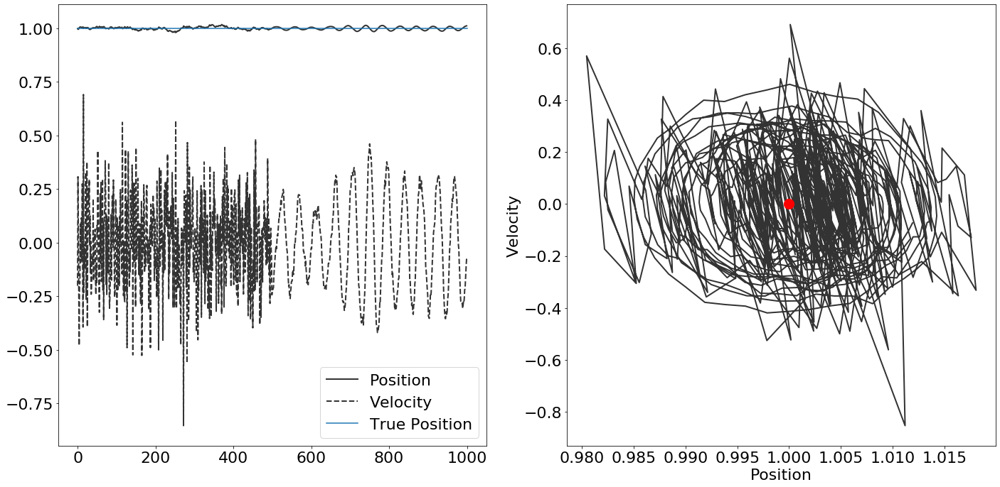

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

k = 1000
p = 0
ax[0].plot(x1[-k:,p], alpha=0.8, color='k', ls='-', lw=2, label='Position')
ax[0].plot(v1[-k:,p], alpha=0.8, color='k', ls='--', lw=2, label='Velocity')
ax[0].plot([0,k], [w[p],w[p]], label='True Position')
ax[0].legend()

ax[1].plot(x1[-k:,p], v1[-k:,p], color='k', alpha=0.8, lw=2)
ax[1].scatter(w[p],0, s=200, zorder=100, color='r')
# ax[1].streamplot(X2, V2, V2, G2, cmap='Blues')

ax[1].set_xlabel('Position')
ax[1].set_ylabel('Velocity')

plt.tight_layout()
# plt.savefig('bias-oscillations.png', format='png', bbox_inches='tight', transparent=True)

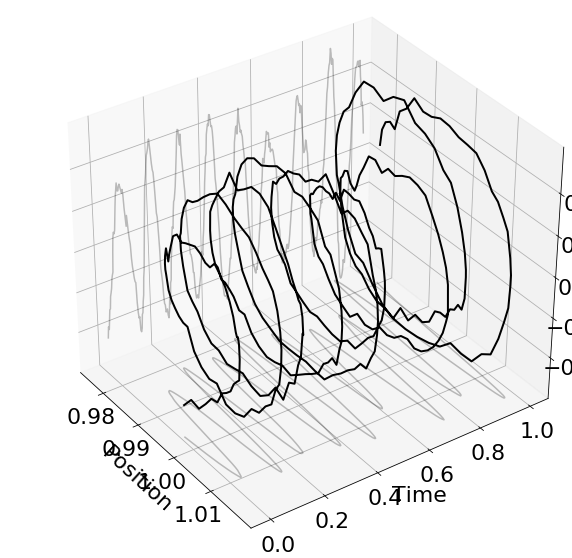

In [66]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')

k = 400
p = 1

time = np.linspace(0,1,k) 

ax.plot(x1[-k:,p], time, v1[-k:,p], lw=2, color='k')
ax.plot(x1[-k:,p], time, min(v1[-k:,p])*np.ones(k), color='k', alpha=0.25)
ax.plot(min(x1[-k:,p])*np.ones(k), time, v1[-k:,p], color='k', alpha=0.25)

ax.set_xlabel('Position')
ax.set_ylabel('Time')
ax.set_zlabel('Velocity')

ax.view_init(elev=35., azim=-35)
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([0.85, 1, 0.85, 0.85]))

plt.show()

In [21]:
def loss(w, b, x, y):
    L = np.mean((x.dot(w) + b - y)**2)
    return L

print(loss(x1[-1001], x2[-1001], X, Y))
print(loss(x1[-1], x2[-1], X, Y))
print(loss(np.mean(x1[-2000:-1000], axis=0), np.mean(x2[-2000:-1000]), X, Y))
print(loss(np.mean(x1[-200:], axis=0), np.mean(x2[-200:]), X, Y))

0.980975598383901
0.9811704023284404
0.973025999081157
0.9720882884913381


In [80]:
L = []
for wi, bi in zip(x1, x2):
    l = loss(wi, bi, X, Y)
    L.append(l)

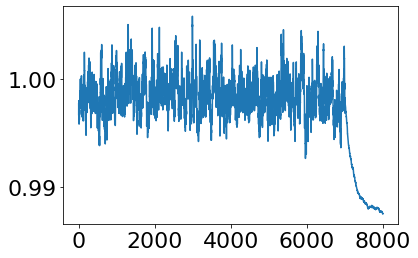

In [84]:
plt.plot(L[-8000:])